In [ ]:
# load google drive content
from google.colab import drive
drive.mount('/content/drive')

# view files in DeePore folder
%cd /content/drive/MyDrive/hb-final-project

import DeePore as dp
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as matplotlib
import scipy.io as sio
from sklearn.metrics import r2_score

# import updatedDP as udp
import deeporerevised as dpr
import os



Mounted at /content/drive
/content/drive/MyDrive/hb-final-project


# MSE

In [ ]:
dp3_3_train_mse = [0.1387, 0.0504, 0.0188, 0.0126, 0.0109, 0.0100, 0.0092, 0.0087, 0.0082, 0.0079,
                  0.0076, 0.0073, 0.0071, 0.0069, 0.0067, 0.0065, 0.0063, 0.0062, 0.0061, 0.0059,  # 20
                  0.0058, 0.0057, 0.0056, 0.0055, 0.0054, 0.0053, 0.0053, 0.0051, 0.0050, 0.0049,
                  0.0048, 0.0047, 0.0047, 0.0047, 0.0047, 0.0046, 0.0046, 0.0046, 0.0046, 0.0045,   # 40
                  0.0045, 0.0045, 0.0045, 0.0045, 0.0044, 0.0044, 0.0044, 0.0044, 0.0044, 0.0043,
                  0.0043, 0.0043, 0.0043, 0.0043, 0.0043, 0.0043, 0.0042, 0.0042, 0.0042, 0.0042,    # 60
                  0.0042, 0.0042, 0.0042, 0.0041, 0.0041, 0.0041, 0.0041, 0.0041, 0.0041, 0.0041,
                  0.0041, 0.0041, 0.0040, 0.0040, 0.0040, 0.0040, 0.0040, 0.0040, 0.0040, 0.0040,   # 80
                  0.0040, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039,
                  0.0039, 0.0039, 0.0038, 0.0038, 0.0038, 0.0038, 0.0038, 0.0038, 0.0038, 0.0038]  # 100



dp3_3_val_mse = [0.0843, 0.0285, 0.0146, 0.0118, 0.0106, 0.0098, 0.0092, 0.0087, 0.0083, 0.0080,
                0.0077, 0.0075, 0.0073, 0.0071, 0.0069, 0.0067, 0.0066, 0.0064, 0.0063, 0.0062,   # 20
                0.0061, 0.0060, 0.0059, 0.0058, 0.0057, 0.0056, 0.0055, 0.0054, 0.0053, 0.0052,
                0.0051, 0.0051, 0.0050, 0.0050, 0.0050, 0.0050, 0.0049, 0.0049, 0.0049, 0.0049,   # 40
                0.0048, 0.0048, 0.0048, 0.0048, 0.0048, 0.0048, 0.0048, 0.0048, 0.0047, 0.0047,
                0.0047, 0.0047, 0.0047, 0.0046, 0.0046, 0.0046, 0.0046, 0.0046, 0.0046, 0.0046,   # 60
                0.0045, 0.0045, 0.0045, 0.0045, 0.0045, 0.0045, 0.0045, 0.0045, 0.0045, 0.0045,
                0.0044, 0.0044, 0.0044, 0.0044, 0.0044, 0.0044, 0.0044, 0.0044, 0.0044, 0.0044,   # 80
                0.0043, 0.0043, 0.0043, 0.0043, 0.0043, 0.0043, 0.0043, 0.0043, 0.0043, 0.0043,
                0.0043, 0.0043, 0.0043, 0.0042, 0.0042, 0.0042, 0.0042, 0.0042, 0.0042, 0.0042]   # 100



In [ ]:
dpr1_3_train_mse = [0.2007, 0.0928, 0.0709, 0.0621, 0.0545, 0.0499, 0.0440, 0.0383, 0.0338, 0.0293,
                     0.0258, 0.0223, 0.0194, 0.0180, 0.0167, 0.0151, 0.0142, 0.0136, 0.0124, 0.0116,  # 20
                     0.0113, 0.0111, 0.0108, 0.0105, 0.0100, 0.0098, 0.0096, 0.0095, 0.0094, 0.0092,
                    0.0088, 0.0085, 0.0082, 0.0078, 0.0075, 0.0073, 0.0071, 0.0069, 0.0066, 0.0063,  # 40
                     0.0060, 0.0060, 0.0058, 0.0054, 0.0053, 0.0053, 0.0052, 0.0052, 0.0052, 0.0051,
                     0.0051, 0.0051, 0.0051, 0.0050, 0.0050, 0.0050, 0.0050, 0.0049, 0.0049, 0.0049,  # 60
                     0.0049, 0.0049, 0.0048, 0.0048, 0.0048, 0.0048, 0.0048, 0.0048, 0.0047, 0.0047,
                     0.0047, 0.0047, 0.0047, 0.0047, 0.0046, 0.0046, 0.0046, 0.0046, 0.0046, 0.0046,  # 80
                     0.0044, 0.0044, 0.0044, 0.0044, 0.0044, 0.0044, 0.0044, 0.0044, 0.0044, 0.0043,
                     0.0043, 0.0043, 0.0043, 0.0043, 0.0043, 0.0043, 0.0043, 0.0042, 0.0042, 0.0042]  # 100


dpr1_3_val_mse = [0.1152, 0.0776, 0.0658, 0.0578, 0.0523, 0.0473, 0.0408, 0.0362, 0.0312, 0.0278,
                   0.0245, 0.0210, 0.0189, 0.0177, 0.0162, 0.0148, 0.0144, 0.0135, 0.0123, 0.0119,    # 20
                   0.0117, 0.0114, 0.0112, 0.0107, 0.0104, 0.0102, 0.0100, 0.0099, 0.0098, 0.0095,
                   0.0091, 0.0088, 0.0085, 0.0081, 0.0078, 0.0076, 0.0074, 0.0072, 0.0069, 0.0067,    # 40
                   0.0065, 0.0064, 0.0061, 0.0058, 0.0058, 0.0057, 0.0057, 0.0057, 0.0056, 0.0056,
                   0.0056, 0.0055, 0.0055, 0.0055, 0.0055, 0.0054, 0.0054, 0.0054, 0.0054, 0.0053,    # 60
                   0.0053, 0.0053, 0.0053, 0.0053, 0.0052, 0.0052, 0.0052, 0.0052, 0.0052, 0.0052,
                   0.0051, 0.0051, 0.0051, 0.0051, 0.0051, 0.0050, 0.0050, 0.0050, 0.0050, 0.0050,    # 80
                   0.0048, 0.0048, 0.0048, 0.0048, 0.0048, 0.0048, 0.0048, 0.0048, 0.0047, 0.0047,
                   0.0047, 0.0047, 0.0047, 0.0047, 0.0047, 0.0047, 0.0046, 0.0046, 0.0046, 0.0046]    # 100


In [ ]:
dpr2_3_train_mse = [0.1304, 0.0378, 0.0199, 0.0161, 0.0143, 0.0133, 0.0124, 0.0116, 0.0106, 0.0100,
                    0.0096, 0.0092, 0.0088, 0.0083, 0.0077, 0.0075, 0.0073, 0.0071, 0.0069, 0.0068,   # 20
                    0.0066, 0.0065, 0.0064, 0.0063, 0.0062, 0.0061, 0.0060, 0.0059, 0.0058, 0.0058,
                    0.0057, 0.0056, 0.0056, 0.0055, 0.0055, 0.0054, 0.0054, 0.0053, 0.0053, 0.0052,   # 40
                    0.0052, 0.0052, 0.0051, 0.0051, 0.0051, 0.0050, 0.0050, 0.0050, 0.0050, 0.0049,
                    0.0049, 0.0049, 0.0048, 0.0048, 0.0047, 0.0046, 0.0046, 0.0046, 0.0046, 0.0046,   # 60
                    0.0045, 0.0045, 0.0045, 0.0045, 0.0045, 0.0044, 0.0044, 0.0044, 0.0044, 0.0044,
                    0.0043, 0.0043, 0.0043, 0.0043, 0.0043, 0.0043, 0.0042, 0.0042, 0.0042, 0.0042,   # 80
                    0.0042, 0.0041, 0.0041, 0.0041, 0.0041, 0.0041, 0.0041, 0.0040, 0.0040, 0.0040,
                    0.0040, 0.0040, 0.0040, 0.0040, 0.0040, 0.0040, 0.0039, 0.0039, 0.0039, 0.0039]   # 100

dpr2_3_val_mse = [0.0622, 0.0241, 0.0175, 0.0153, 0.0141, 0.0133, 0.0125, 0.0116, 0.0109, 0.0104,
                  0.0100, 0.0096, 0.0092, 0.0085, 0.0082, 0.0080, 0.0078, 0.0077, 0.0075, 0.0074,     # 20
                  0.0072, 0.0071, 0.0070, 0.0069, 0.0068, 0.0067, 0.0066, 0.0065, 0.0065, 0.0064,
                  0.0063, 0.0062, 0.0062, 0.0061, 0.0061, 0.0060, 0.0060, 0.0059, 0.0059, 0.0059,     # 40
                  0.0058, 0.0058, 0.0057, 0.0057, 0.0057, 0.0056, 0.0056, 0.0056, 0.0056, 0.0055,
                  0.0055, 0.0055, 0.0054, 0.0054, 0.0053, 0.0052, 0.0052, 0.0052, 0.0052, 0.0051,     # 60
                  0.0051, 0.0051, 0.0051, 0.0050, 0.0050, 0.0050, 0.0050, 0.0050, 0.0049, 0.0049,
                  0.0049, 0.0049, 0.0049, 0.0048, 0.0048, 0.0048, 0.0048, 0.0048, 0.0048, 0.0047,     # 80
                  0.0047, 0.0047, 0.0047, 0.0047, 0.0047, 0.0047, 0.0046, 0.0046, 0.0046, 0.0046,
                  0.0046, 0.0046, 0.0046, 0.0046, 0.0045, 0.0045, 0.0045, 0.0045, 0.0045, 0.0045]     # 100


In [ ]:
dpr1_6_train_mse = [0.2051, 0.0868, 0.0651, 0.0579, 0.0529, 0.0483, 0.0445, 0.0394, 0.0352, 0.0310,
                    0.0280, 0.0268, 0.0251, 0.0229, 0.0205, 0.0190, 0.0181, 0.0168, 0.0159, 0.0154,   # 20
                    0.0146, 0.0136, 0.0130, 0.0124, 0.0119, 0.0116, 0.0109, 0.0101, 0.0097, 0.0095,
                    0.0094, 0.0093, 0.0092, 0.0091, 0.0090, 0.0088, 0.0083, 0.0082, 0.0081, 0.0080,   # 40
                    0.0080, 0.0079, 0.0078, 0.0078, 0.0077, 0.0077, 0.0076, 0.0075, 0.0074, 0.0074,
                    0.0073, 0.0071, 0.0068, 0.0067, 0.0066, 0.0066, 0.0065, 0.0065, 0.0065, 0.0063,   # 60
                    0.0060, 0.0059, 0.0059, 0.0058, 0.0058, 0.0058, 0.0057, 0.0057, 0.0057, 0.0056,
                    0.0056, 0.0056, 0.0056, 0.0056, 0.0055, 0.0055, 0.0055, 0.0054, 0.0054, 0.0054,   # 80
                    0.0053, 0.0053, 0.0053, 0.0053, 0.0052, 0.0052, 0.0052, 0.0052, 0.0051, 0.0051,
                    0.0051, 0.0051, 0.0050, 0.0050, 0.0050, 0.0050, 0.0050, 0.0049, 0.0049, 0.0049,   # 100
                    0.0049, 0.0049, 0.0048, 0.0048, 0.0048, 0.0048, 0.0048, 0.0047, 0.0047, 0.0047,
                    0.0047, 0.0046, 0.0046, 0.0046, 0.0046, 0.0046, 0.0045, 0.0045, 0.0045, 0.0045,   # 120
                    0.0045, 0.0044, 0.0044, 0.0044, 0.0044, 0.0044, 0.0044, 0.0043, 0.0043, 0.0043,
                    0.0043, 0.0043, 0.0043, 0.0043, 0.0042, 0.0042, 0.0042, 0.0042, 0.0042, 0.0042,   # 140
                    0.0042, 0.0042, 0.0042, 0.0041, 0.0041]


dpr1_6_val_mse = [0.1120, 0.0697, 0.0604, 0.0541, 0.0500, 0.0459, 0.0413, 0.0365, 0.0327, 0.0286,
                  0.0269, 0.0258, 0.0237, 0.0213, 0.0193, 0.0185, 0.0171, 0.0161, 0.0155, 0.0149,     # 20
                  0.0140, 0.0131, 0.0127, 0.0120, 0.0117, 0.0112, 0.0104, 0.0097, 0.0095, 0.0094,
                  0.0093, 0.0092, 0.0091, 0.0090, 0.0089, 0.0084, 0.0082, 0.0081, 0.0080, 0.0080,     # 40
                  0.0079, 0.0079, 0.0078, 0.0078, 0.0077, 0.0076, 0.0075, 0.0075, 0.0074, 0.0074,
                  0.0073, 0.0069, 0.0068, 0.0067, 0.0067, 0.0066, 0.0066, 0.0066, 0.0065, 0.0061,     # 60
                  0.0060, 0.0060, 0.0059, 0.0059, 0.0059, 0.0069, 0.0058, 0.0058, 0.0058, 0.0058,
                  0.0057, 0.0058, 0.0058, 0.0058, 0.0057, 0.0057, 0.0057, 0.0056, 0.0056, 0.0056,     # 80
                  0.0067, 0.0056, 0.0056, 0.0056, 0.0055, 0.0055, 0.0055, 0.0054, 0.0054, 0.0053,
                  0.0053, 0.0053, 0.0052, 0.0052, 0.0052, 0.0060, 0.0052, 0.0052, 0.0051, 0.0051,     # 100
                  0.0051, 0.0051, 0.0050, 0.0050, 0.0050, 0.0050, 0.0050, 0.0049, 0.0049, 0.0049,
                  0.0049, 0.0049, 0.0049, 0.0049, 0.0049, 0.0049, 0.0048, 0.0048, 0.0048, 0.0048,     # 120
                  0.0048, 0.0048, 0.0048, 0.0047, 0.0047, 0.0053, 0.0047, 0.0047, 0.0047, 0.0047,
                  0.0047, 0.0047, 0.0046, 0.0046, 0.0046, 0.0046, 0.0046, 0.0046, 0.0046, 0.0046,     # 140
                  0.0046, 0.0046, 0.0046, 0.0045, 0.0045]


In [ ]:
dpr2_6_train_mse = [0.1267, 0.0519, 0.0414, 0.0375, 0.0336, 0.0306, 0.0286, 0.0267, 0.0252, 0.0242,
                    0.0229, 0.0218, 0.0207, 0.0201, 0.0198, 0.0194, 0.0187, 0.0183, 0.0175, 0.0166,   # 20
                    0.0162, 0.0157, 0.0155, 0.0148, 0.0140, 0.0138, 0.0136, 0.0133, 0.0130, 0.0126,
                    0.0124, 0.0123, 0.0121, 0.0118, 0.0117, 0.0115, 0.0113, 0.0104, 0.0101, 0.0100,   # 40
                    0.0099, 0.0093, 0.0092, 0.0091, 0.0090, 0.0090, 0.0089, 0.0088, 0.0088, 0.0087,
                    0.0086, 0.0086, 0.0085, 0.0084, 0.0080, 0.0078, 0.0077, 0.0073, 0.0071, 0.0070,   # 60
                    0.0070, 0.0069, 0.0069, 0.0068, 0.0065, 0.0062, 0.0061, 0.0061, 0.0059, 0.0057,
                    0.0056, 0.0056, 0.0056, 0.0055, 0.0055, 0.0055, 0.0054, 0.0054, 0.0054, 0.0053,   # 80
                    0.0053, 0.0053, 0.0052, 0.0052, 0.0052, 0.0051, 0.0051, 0.0051, 0.0051, 0.0050,
                    0.0050, 0.0050, 0.0050, 0.0049, 0.0049, 0.0049, 0.0049, 0.0048, 0.0048, 0.0047,   # 100
                    0.0047, 0.0047, 0.0047, 0.0046, 0.0046, 0.0046, 0.0046, 0.0046, 0.0045, 0.0045,
                    0.0045, 0.0045, 0.0045, 0.0044, 0.0044, 0.0044, 0.0044, 0.0044, 0.0044, 0.0043,   # 120
                    0.0043, 0.0043, 0.0043, 0.0043, 0.0043, 0.0042, 0.0042, 0.0042, 0.0042, 0.0042,
                    0.0041, 0.0041, 0.0041, 0.0041, 0.0041, 0.0040, 0.0040, 0.0040, 0.0040, 0.0040,   # 140
                    0.0039, 0.0039, 0.0039, 0.0039, 0.0039]



dpr2_6_val_mse = [0.0632, 0.0442, 0.0384, 0.0356, 0.0320, 0.0296, 0.0276, 0.0257, 0.0248, 0.0236,
                  0.0227, 0.0213, 0.0206, 0.0202, 0.0199, 0.0195, 0.0188, 0.0184, 0.0172, 0.0168,     # 20
                  0.0162, 0.0160, 0.0157, 0.0145, 0.0142, 0.0141, 0.0138, 0.0136, 0.0131, 0.0129,
                  0.0128, 0.0127, 0.0123, 0.0121, 0.0120, 0.0119, 0.0113, 0.0106, 0.0105, 0.0104,     # 40
                  0.0100, 0.0096, 0.0096, 0.0095, 0.0094, 0.0093, 0.0093, 0.0092, 0.0091, 0.0091,
                  0.0090, 0.0089, 0.0089, 0.0087, 0.0082, 0.0081, 0.0080, 0.0075, 0.0074, 0.0074,     # 60
                  0.0073, 0.0073, 0.0073, 0.0071, 0.0067, 0.0066, 0.0065, 0.0065, 0.0065, 0.0062,
                  0.0060, 0.0060, 0.0060, 0.0059, 0.0059, 0.0059, 0.0058, 0.0058, 0.0058, 0.0057,     # 80
                  0.0057, 0.0057, 0.0056, 0.0056, 0.0056, 0.0056, 0.0056, 0.0056, 0.0056, 0.0055,
                  0.0054, 0.0054, 0.0054, 0.0054, 0.0053, 0.0053, 0.0053, 0.0052, 0.0052, 0.0052,     # 100
                  0.0051, 0.0051, 0.0051, 0.0050, 0.0050, 0.0050, 0.0049, 0.0049, 0.0049, 0.0049,
                  0.0049, 0.0049, 0.0048, 0.0048, 0.0048, 0.0048, 0.0048, 0.0048, 0.0048, 0.0048,     # 120
                  0.0048, 0.0048, 0.0048, 0.0048, 0.0047, 0.0047, 0.0047, 0.0047, 0.0047, 0.0047,
                  0.0046, 0.0046, 0.0046, 0.0046, 0.0046, 0.0045, 0.0045, 0.0045, 0.0045, 0.0045,     #140
                  0.0044, 0.0044, 0.0044, 0.0044, 0.0044]




In [ ]:
group1_train_mse = [0.1331, 0.0624, 0.0512, 0.0465, 0.0427,
             0.0421, 0.0410, 0.0400, 0.0377, 0.0362,   # 10
             0.0352, 0.0337, 0.0322, 0.0311, 0.0303,
             0.0294, 0.0290, 0.0284, 0.0278, 0.0277,  # 20
             0.0275, 0.0265, 0.0263, 0.0262, 0.0261,
             0.0260, 0.0259, 0.0256, 0.0255, 0.0254,   # 30
             0.0245, 0.0241, 0.0234, 0.0228, 0.0227,
             0.0226, 0.0218, 0.0217, 0.0216, 0.0215,  # 40
             0.0208, 0.0206, 0.0197, 0.0188, 0.0187,
             0.0184, 0.0173, 0.0168, 0.0164, 0.0158,  # 50
             0.0157, 0.0151, 0.0144, 0.0137, 0.0136,
             0.0136, 0.0135, 0.0135, 0.0130, 0.0126,  # 60
             0.0125, 0.0125, 0.0124, 0.0124, 0.0124,
             0.0124, 0.0123, 0.0123, 0.0123, 0.0122,  # 70
             0.0122, 0.0122, 0.0122, 0.0121, 0.0121,
             0.0121, 0.0120, 0.0120, 0.0120, 0.0120,  # 80
             0.0119, 0.0119, 0.0119, 0.0119, 0.0118,
             0.0115, 0.0110, 0.0110, 0.0107, 0.0101,  # 90
             0.0094, 0.0089, 0.0084, 0.0083, 0.0083,
             0.0083, 0.0082, 0.0079, 0.0076, 0.0075,  # 100
             0.0075, 0.0075, 0.0075, 0.0075, 0.0074,
             0.0074, 0.0069, 0.0065, 0.0064, 0.0064,  # 110
             0.0064, 0.0064, 0.0064, 0.0063, 0.0063,
             0.0060, 0.0054, 0.0054, 0.0053, 0.0053,  # 120
             0.0053, 0.0053, 0.0048, 0.0045, 0.0045,
             0.0045, 0.0045, 0.0044, 0.0044, 0.0044,  # 130
             0.0044, 0.0044, 0.0044, 0.0044, 0.0044,
             0.0043, 0.0043, 0.0043, 0.0043, 0.0043,  # 140
             0.0043, 0.0043, 0.0043, 0.0043, 0.0043]  # 145

group1_val_mse = [0.0772, 0.0550, 0.0491, 0.0435, 0.0428,
           0.0416, 0.0411, 0.0390, 0.0373, 0.0362,  # 10
           0.0344, 0.0339, 0.0321, 0.0310, 0.0307,
           0.0297, 0.0294, 0.0285, 0.0283, 0.0282,  # 20
           0.0274, 0.0270, 0.0269, 0.0267, 0.0266,
           0.0265, 0.0264, 0.0262, 0.0261, 0.0258,  # 30
           0.0247, 0.0246, 0.0235, 0.0234, 0.0233,
           0.0227, 0.0224, 0.0223, 0.0222, 0.0220,  # 40
           0.0212, 0.0211, 0.0196, 0.0194, 0.0193,
           0.0184, 0.0175, 0.0173, 0.0165, 0.0164,  # 50
           0.0163, 0.0153, 0.0144, 0.0143, 0.0142,
           0.0142, 0.0141, 0.0140, 0.0132, 0.0132,  # 60
           0.0131, 0.0131, 0.0131, 0.0130, 0.0130,
           0.0130, 0.0129, 0.0129, 0.0129, 0.0128,  # 70
           0.0128, 0.0128, 0.0127, 0.0127, 0.0127,
           0.0127, 0.0126, 0.0126, 0.0126, 0.0126,  # 80
           0.0125, 0.0125, 0.0125, 0.0125, 0.0124,
           0.0117, 0.0116, 0.0115, 0.0108, 0.0105,  # 90
           0.0097, 0.0090, 0.0089, 0.0088, 0.0088,
           0.0088, 0.0088, 0.0082, 0.0081, 0.0081,  # 100
           0.0080, 0.0080, 0.0080, 0.0080, 0.0080,
           0.0079, 0.0071, 0.0070, 0.0070, 0.0069,  # 110
           0.0069, 0.0069, 0.0069, 0.0069, 0.0068,
           0.0060, 0.0059, 0.0059, 0.0058, 0.0058,  # 120
           0.0058, 0.0057, 0.0051, 0.0050, 0.0050,
           0.0050, 0.0050, 0.0049, 0.0049, 0.0049,  # 130
           0.0049, 0.0049, 0.0049, 0.0049, 0.0048,
           0.0048, 0.0048, 0.0048, 0.0048, 0.0048,  # 140
           0.0048, 0.0047, 0.0047, 0.0047, 0.0047]  # 145

In [ ]:
group2_train_mse = [0.1330, 0.0757, 0.0618, 0.0544, 0.0468,
             0.0407, 0.0352, 0.0310, 0.0278, 0.0254,  # 10
             0.0241, 0.0231, 0.0222, 0.0212, 0.0196,
             0.0184, 0.0172, 0.0163, 0.0156, 0.0150,  # 20
             0.0144, 0.0138, 0.0134, 0.0131, 0.0127,
             0.0124, 0.0122, 0.0119, 0.0117, 0.0114,  # 30
              0.0111, 0.0107, 0.0105, 0.0102, 0.0100,
              0.0098, 0.0096, 0.0094, 0.0088, 0.0082, # 40
              0.0079, 0.0077, 0.0076, 0.0074, 0.0073,
              0.0071, 0.0070, 0.0069, 0.0068, 0.0067, # 50
              0.0065, 0.0064, 0.0063, 0.0062, 0.0061,
              0.0060, 0.0059, 0.0058, 0.0057, 0.0056, # 60
              0.0055, 0.0054, 0.0054, 0.0053, 0.0052,
              0.0051, 0.0051, 0.0050, 0.0050, 0.0049, # 70
              0.0048, 0.0048, 0.0047, 0.0047, 0.0046,
              0.0046, 0.0045, 0.0045, 0.0045, 0.0044, # 80
              0.0044, 0.0043, 0.0043, 0.0042, 0.0042,
              0.0042, 0.0041, 0.0041, 0.0040, 0.0040, # 90
              0.0040, 0.0039, 0.0039, 0.0039, 0.0038,
              0.0038, 0.0038, 0.0038, 0.0037, 0.0037, # 100
              0.0037, 0.0036, 0.0036, 0.0036, 0.0036,
              0.0035, 0.0035, 0.0035, 0.0035, 0.0035, # 110
              0.0034, 0.0034, 0.0034, 0.0034, 0.0033,
              0.0033, 0.0033, 0.0033, 0.0033, 0.0032, # 120
              0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
              0.0031, 0.0031, 0.0031, 0.0031, 0.0031, # 130
              0.0031, 0.0030, 0.0030, 0.0030, 0.0030,
              0.0030, 0.0030, 0.0029, 0.0029, 0.0029, # 140
              0.0029, 0.0029, 0.0029, 0.0029, 0.0028] # 145



group2_val_mse = [ 0.0917, 0.0656, 0.0572, 0.0501, 0.0435,
           0.0381, 0.0331, 0.0299, 0.0268, 0.0252,  # 10
           0.0241, 0.0232, 0.0223, 0.0209, 0.0194,
           0.0181, 0.0171, 0.0163, 0.0157, 0.0150,  # 20
           0.0144, 0.0140, 0.0136, 0.0133, 0.0129,
           0.0126, 0.0124, 0.0121, 0.0119, 0.0116,   # 30
            0.0112, 0.0109, 0.0107, 0.0105, 0.0103,
            0.0101, 0.0099, 0.0095, 0.0088, 0.0084, # 40
            0.0082, 0.0081, 0.0079, 0.0078, 0.0077,
            0.0076, 0.0074, 0.0073, 0.0072, 0.0071, # 50
            0.0070, 0.0069, 0.0068, 0.0067, 0.0066,
            0.0065, 0.0064, 0.0063, 0.0062, 0.0061, # 60
            0.0061, 0.0060, 0.0059, 0.0058, 0.0058,
            0.0057, 0.0057, 0.0056, 0.0056, 0.0055, # 70
            0.0054, 0.0054, 0.0053, 0.0053, 0.0052,
            0.0052, 0.0052, 0.0051, 0.0051, 0.0050, # 80
            0.0050, 0.0049, 0.0049, 0.0049, 0.0048,
            0.0048, 0.0047, 0.0047, 0.0047, 0.0046, # 90
            0.0046, 0.0046, 0.0046, 0.0045, 0.0045,
            0.0045, 0.0045, 0.0044, 0.0044, 0.0043, # 100
            0.0043, 0.0043, 0.0042, 0.0042, 0.0042,
            0.0042, 0.0041, 0.0041, 0.0041, 0.0041, # 110
            0.0040, 0.0040, 0.0040, 0.0040, 0.0040,
            0.0039, 0.0039, 0.0039, 0.0039, 0.0039, # 120
            0.0038, 0.0038, 0.0038, 0.0038, 0.0038,
            0.0037, 0.0037, 0.0037, 0.0037, 0.0037, # 130
            0.0036, 0.0036, 0.0036, 0.0036, 0.0036,
            0.0036, 0.0035, 0.0035, 0.0035, 0.0035, # 140
            0.0035, 0.0035, 0.0035, 0.0034, 0.0034] # 145



In [ ]:
# add same value to end of 3 slice arrays
lastval=dp3_3_train_mse[-1]
repeated = np.full(45, lastval)
dp3_3_train_mse = np.concatenate((dp3_3_train_mse, repeated))
lastval=dp3_3_val_mse[-1]
repeated = np.full(45, lastval)
dp3_3_val_mse = np.concatenate((dp3_3_val_mse, repeated))

lastval=dpr1_3_train_mse[-1]
repeated = np.full(45, lastval)
dpr1_3_train_mse = np.concatenate((dpr1_3_train_mse, repeated))
lastval=dpr1_3_val_mse[-1]
repeated = np.full(45, lastval)
dpr1_3_val_mse = np.concatenate((dpr1_3_val_mse, repeated))

lastval=dpr2_3_train_mse[-1]
repeated = np.full(45, lastval)
dpr2_3_train_mse = np.concatenate((dpr2_3_train_mse, repeated))
lastval=dpr2_3_val_mse[-1]
repeated = np.full(45, lastval)
dpr2_3_val_mse = np.concatenate((dpr2_3_val_mse, repeated))


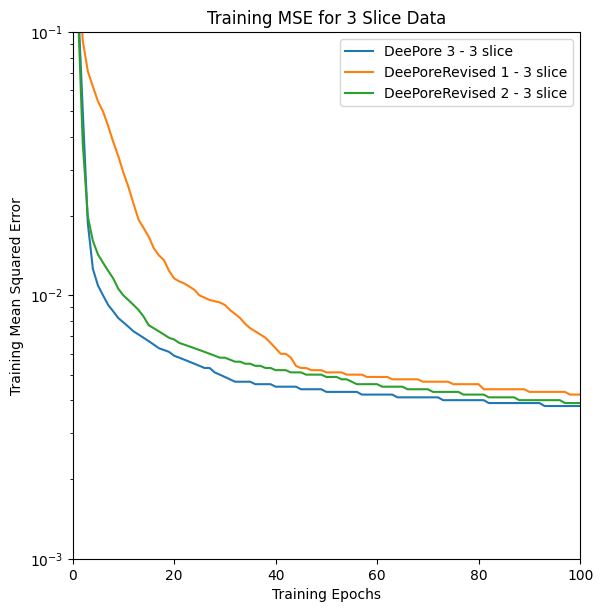

In [ ]:
# train 3 slice
epochs_3 = np.arange(1, 101)

plt.rcParams.update({'font.size': 10})

# Plotting
plt.figure(figsize=(6, 6))

plt.plot(epochs_3, dp3_3_train_mse, label='DeePore 3 - 3 slice')
plt.plot(epochs_3, dpr1_3_train_mse, label='DeePoreRevised 1 - 3 slice')
plt.plot(epochs_3, dpr2_3_train_mse, label='DeePoreRevised 2 - 3 slice')

plt.xlabel('Training Epochs')
plt.ylabel('Training Mean Squared Error')
plt.legend()
plt.yscale('log')
plt.tight_layout()
plt.xlim(left=0, right=100)
plt.ylim(0.001, 0.1)
plt.title('Training MSE for 3 Slice Data')

plt.show()


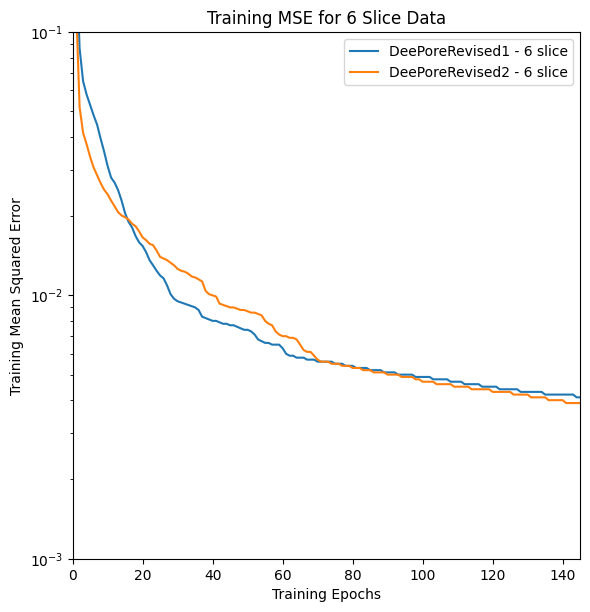

In [ ]:
# train 6 slice
epochs_6 = np.arange(1, 146)

# Plotting
plt.figure(figsize=(6, 6))

plt.plot(epochs_6, dpr1_6_train_mse, label='DeePoreRevised1 - 6 slice')
plt.plot(epochs_6, dpr2_6_train_mse, label='DeePoreRevised2 - 6 slice')

plt.xlabel('Training Epochs')
plt.ylabel('Training Mean Squared Error')
plt.legend()
plt.yscale('log')
plt.tight_layout()
plt.xlim(left=0, right=145)
plt.ylim(0.001, 0.1)
plt.title('Training MSE for 6 Slice Data')

plt.show()


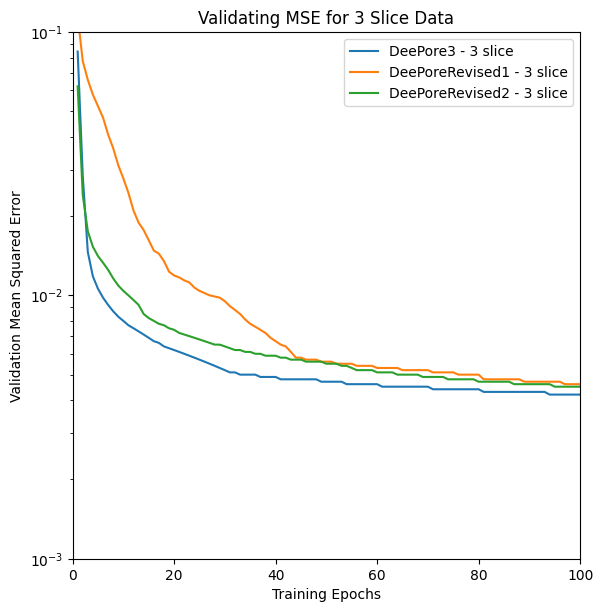

In [ ]:
# val 3 slice
epochs_3 = np.arange(1, 101)

# Plotting
plt.figure(figsize=(6, 6))

plt.plot(epochs_3, dp3_3_val_mse, label='DeePore3 - 3 slice')
plt.plot(epochs_3, dpr1_3_val_mse, label='DeePoreRevised1 - 3 slice')
plt.plot(epochs_3, dpr2_3_val_mse, label='DeePoreRevised2 - 3 slice')

plt.xlabel('Training Epochs')
plt.ylabel('Validation Mean Squared Error')
plt.legend()
plt.yscale('log')
plt.tight_layout()
plt.xlim(left=0, right=100)
plt.ylim(0.001, 0.1)
plt.title('Validating MSE for 3 Slice Data')


plt.show()

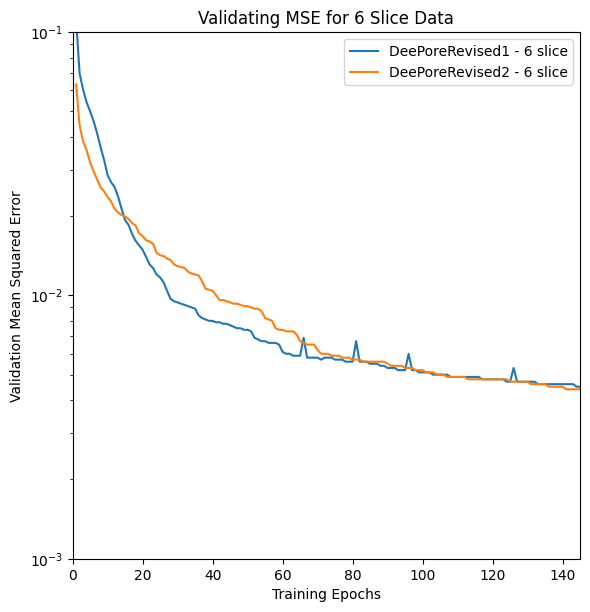

In [ ]:
# val 6 slice
epochs_6 = np.arange(1, 146)

# Plotting
plt.figure(figsize=(6, 6))

plt.plot(epochs_6, dpr1_6_val_mse, label='DeePoreRevised1 - 6 slice')
plt.plot(epochs_6, dpr2_6_val_mse, label='DeePoreRevised2 - 6 slice')

plt.xlabel('Training Epochs')
plt.ylabel('Validation Mean Squared Error')
plt.legend()
plt.yscale('log')
plt.tight_layout()
plt.xlim(left=0, right=145)
plt.ylim(0.001, 0.1)
plt.title('Validating MSE for 6 Slice Data')


plt.show()

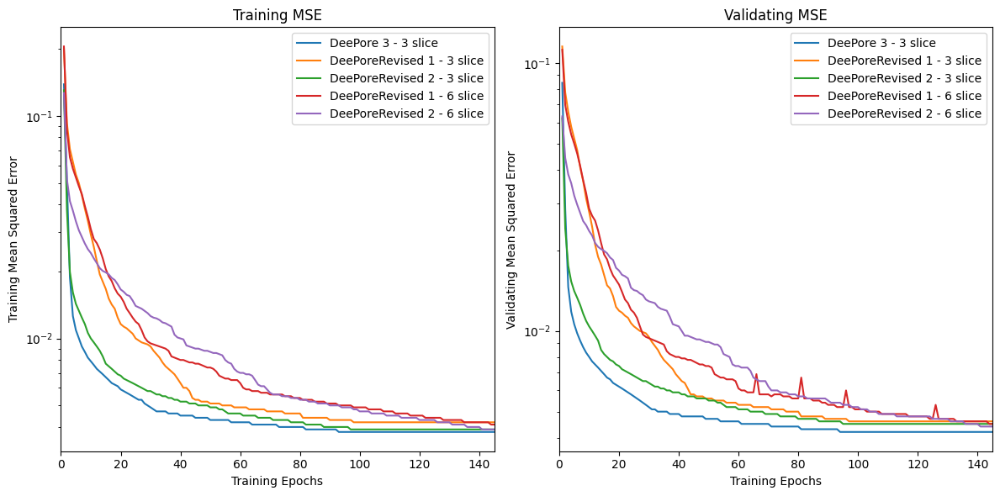

In [ ]:
# all training/val mse
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

epochs_6 = np.arange(1, 146)

# Plot 1
axs[0].plot(epochs_6, dp3_3_train_mse, label='DeePore 3 - 3 slice')
axs[0].plot(epochs_6, dpr1_3_train_mse, label='DeePoreRevised 1 - 3 slice')
axs[0].plot(epochs_6, dpr2_3_train_mse, label='DeePoreRevised 2 - 3 slice')
axs[0].plot(epochs_6, dpr1_6_train_mse, label='DeePoreRevised 1 - 6 slice')
axs[0].plot(epochs_6, dpr2_6_train_mse, label='DeePoreRevised 2 - 6 slice')
axs[0].set_xlabel('Training Epochs')
axs[0].set_ylabel('Training Mean Squared Error')
axs[0].legend()
axs[0].set_yscale('log')
axs[0].set_xlim(left=0, right=145)
axs[0].set_title('Training MSE')

axs[1].plot(epochs_6, dp3_3_val_mse, label='DeePore 3 - 3 slice')
axs[1].plot(epochs_6, dpr1_3_val_mse, label='DeePoreRevised 1 - 3 slice')
axs[1].plot(epochs_6, dpr2_3_val_mse, label='DeePoreRevised 2 - 3 slice')
axs[1].plot(epochs_6, dpr1_6_val_mse, label='DeePoreRevised 1 - 6 slice')
axs[1].plot(epochs_6, dpr2_6_val_mse, label='DeePoreRevised 2 - 6 slice')
axs[1].set_xlabel('Training Epochs')
axs[1].set_ylabel('Validating Mean Squared Error')
axs[1].legend()
axs[1].set_yscale('log')
axs[1].set_xlim(left=0, right=145)
axs[1].set_title('Validating MSE')


plt.tight_layout()

plt.show()

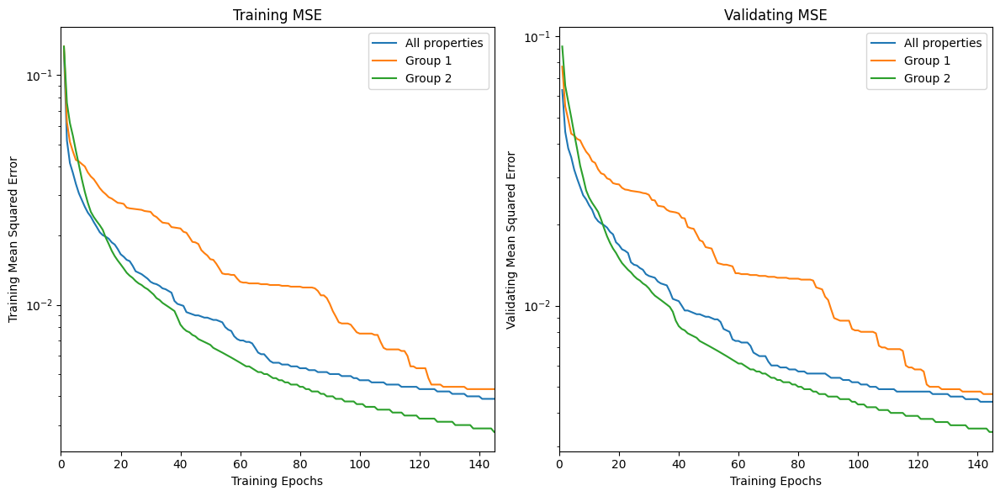

In [ ]:
# final model
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

epochs_6 = np.arange(1, 146)

# Plot 1
axs[0].plot(epochs_6, dpr2_6_train_mse, label='All properties')
axs[0].plot(epochs_6, group1_train_mse, label='Group 1')
axs[0].plot(epochs_6, group2_train_mse, label='Group 2')

axs[0].set_xlabel('Training Epochs')
axs[0].set_ylabel('Training Mean Squared Error')
axs[0].legend()
axs[0].set_yscale('log')
axs[0].set_xlim(left=0, right=145)
axs[0].set_title('Training MSE')

axs[1].plot(epochs_6, dpr2_6_val_mse, label='All properties')
axs[1].plot(epochs_6, group1_val_mse, label='Group 1')
axs[1].plot(epochs_6, group2_val_mse, label='Group 2')

axs[1].set_xlabel('Training Epochs')
axs[1].set_ylabel('Validating Mean Squared Error')
axs[1].legend()
axs[1].set_yscale('log')
axs[1].set_xlim(left=0, right=145)
axs[1].set_title('Validating MSE')


plt.tight_layout()

plt.show()

# Testing Models

In [ ]:
dataset_1 = '/content/drive/MyDrive/Project/DeePore_Compact_Data.h5'
dataset_2 = '/content/drive/MyDrive/Project/new_compact_dataset_2.h5'

List1=dpr.prep(dataset_1)
List2=dpr.prep(dataset_2)

TestListShort1=List1[1:1000]     #uncomment for a smaller dataset for test purposes
TestListShort2=List2[1:1000]     #uncomment for a smaller dataset for test purposes

TrainList1, EvalList1, TestList1 = dpr.splitdata(List1)
TrainList2, EvalList2, TestList2 = dpr.splitdata(List2)


Checking the data for outliers. Please wait...
checking sample: 0
checking sample: 100
checking sample: 200
checking sample: 300
checking sample: 400
checking sample: 500
checking sample: 600
checking sample: 700
checking sample: 800
checking sample: 900
checking sample: 1000
checking sample: 1100
checking sample: 1200
checking sample: 1300
checking sample: 1400
checking sample: 1500
checking sample: 1600
checking sample: 1700
checking sample: 1800
checking sample: 1900
checking sample: 2000
checking sample: 2100
checking sample: 2200
checking sample: 2300
checking sample: 2400
checking sample: 2500
checking sample: 2600
checking sample: 2700
checking sample: 2800
checking sample: 2900
checking sample: 3000
checking sample: 3100
checking sample: 3200
checking sample: 3300
checking sample: 3400
checking sample: 3500
checking sample: 3600
checking sample: 3700
checking sample: 3800
checking sample: 3900
checking sample: 4000
checking sample: 4100
checking sample: 4200
checking sample: 43

In [ ]:
dp3_3=dpr.loadmodel(ModelType=3, n=1)
dpr1_3=dpr.loadmodel(ModelType=11, n=1)
dpr1_6=dpr.loadmodel(ModelType=11, n=2)
dpr2_3=dpr.loadmodel(ModelType=12, n=1)
dpr2_6=dpr.loadmodel(ModelType=12, n=2)

In [ ]:
group_1 = [1,4,7,8,9,10,12,16,17,18,20,21,22,23,24,25,26]
# iterate through subtracting 1 from each
group_1 = [x-1 for x in group_1]


group_2 = [2,3,5,6,11,13,14,15,19,27,28,29,30]
# iterate through subtracting 1 from each
group_2 = [x-1 for x in group_2]


full = dpr.loadmodel(ModelType=12, n=2)
group1 = dpr.loadmodel(ModelType=12, properties=group_1, n=2)
group2 = dpr.loadmodel(ModelType=12, properties=group_2, n=2)

In [7]:
import time

start = time.time()
dpr.testmodel(dp3_3,dataset_1, TestList1, ModelType=3,n=1)
end = time.time()
print(end-start)

start = time.time()
dpr.testmodel(dpr1_3,dataset_1, TestList1, ModelType=11,n=1)
end = time.time()
print(end-start)

start = time.time()
dpr.testmodel(dpr1_6,dataset_2, TestList2, ModelType=11,n=2)
end = time.time()
print(end-start)

dpr.testmodel(dpr2_3,dataset_1, TestList1, ModelType=12,n=1)
dpr.testmodel(dpr2_6,dataset_2, TestList2, ModelType=12,n=2)

dpr.testmodel(group1,dataset_2, TestList2, properties=group_1, ModelType=12,n=2)
dpr.testmodel(group2,dataset_2, TestList2, properties=group_2, ModelType=12,n=2)


In [ ]:
# full
dpr.testmodel(full,dataset_2, TestList2, ModelType=12,n=2)
dpr.testmodel(full,dataset_2, TestListShort2, ModelType=12,n=2)

Output hidden; open in https://colab.research.google.com to view.

50/50 [==============================] - 8s 167ms/step

# Evaluate on 1596 test data
32/32 [==============================] - 5s 163ms/step

# Evaluate on 999 test data
20/20 [==============================] - 6s 277ms/step - loss: 0.0028 - mse: 0.0028


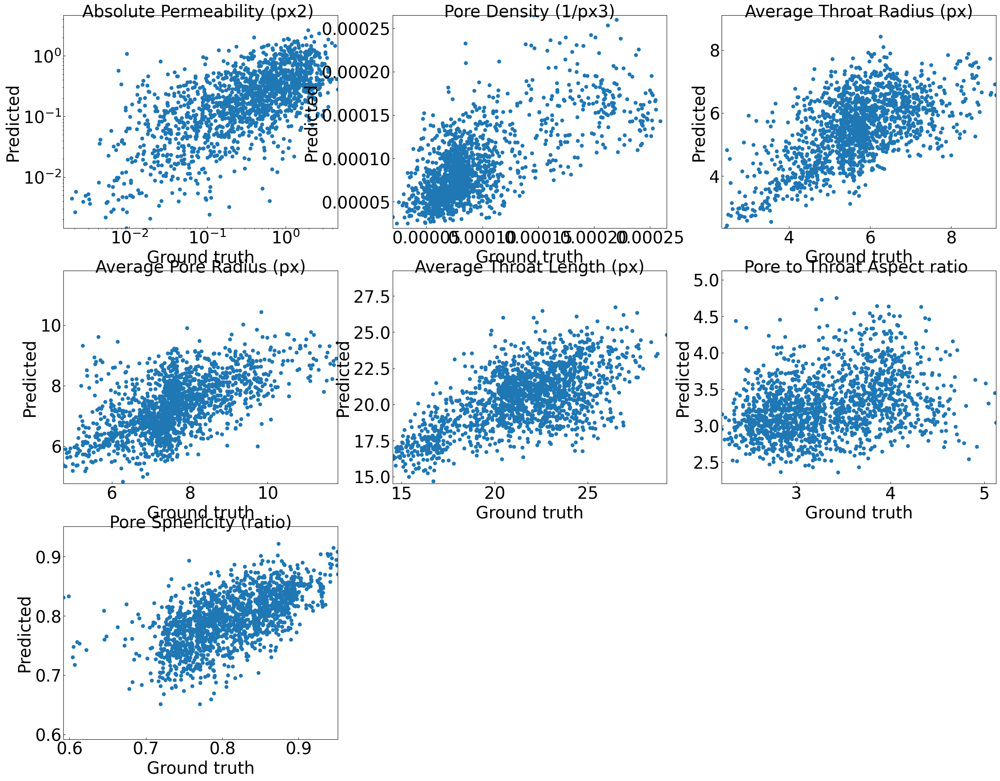

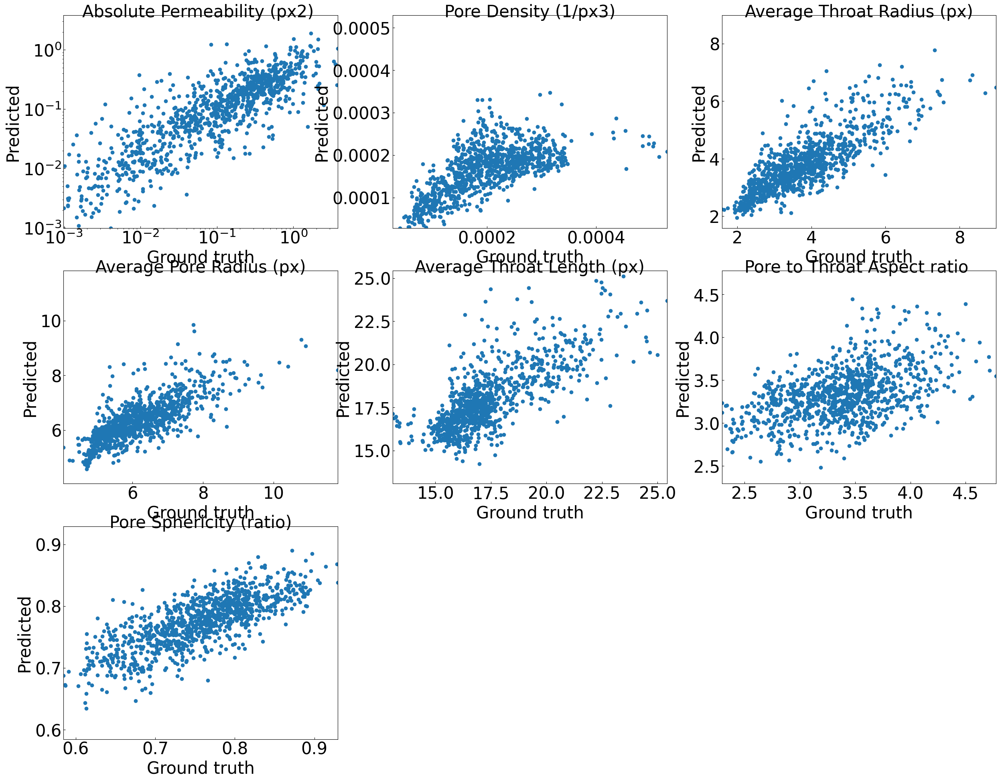

In [ ]:
# group 1
dpr.testmodel(group1,dataset_2, TestList2, ModelType=12,n=2, properties=group_1)
dpr.testmodel(group1,dataset_2, TestListShort2, ModelType=12,n=2, properties=group_1)

50/50 [==============================] - 10s 201ms/step

# Evaluate on 1596 test data
32/32 [==============================] - 5s 161ms/step

# Evaluate on 999 test data
20/20 [==============================] - 7s 308ms/step - loss: 0.0024 - mse: 0.0024


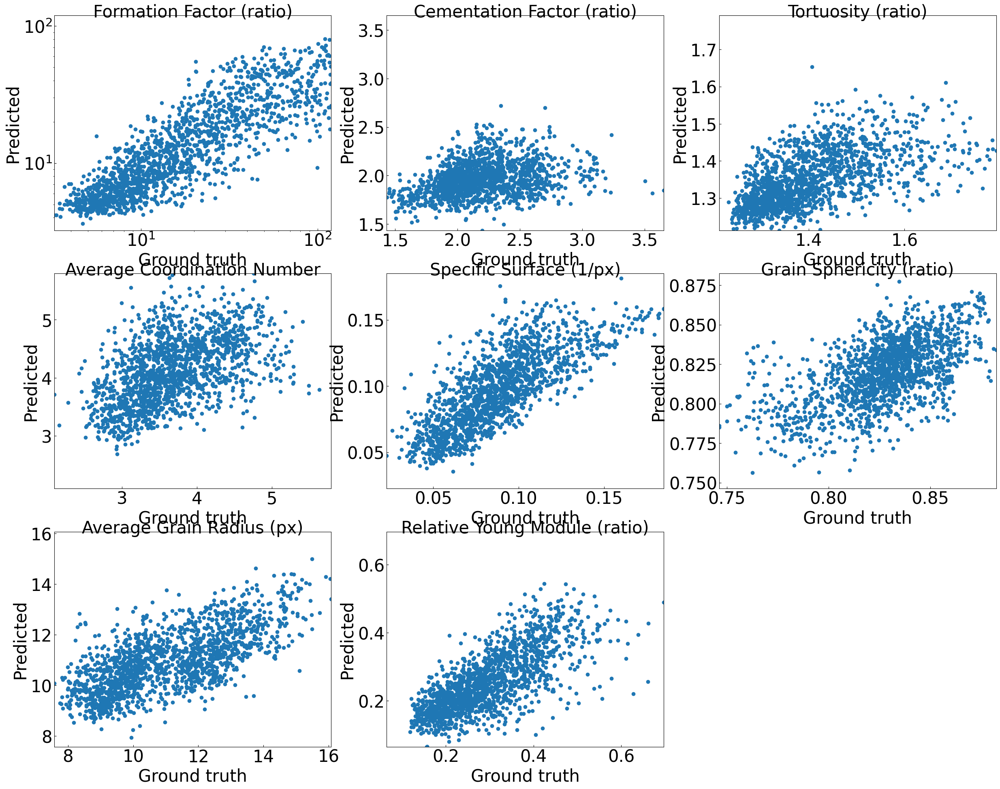

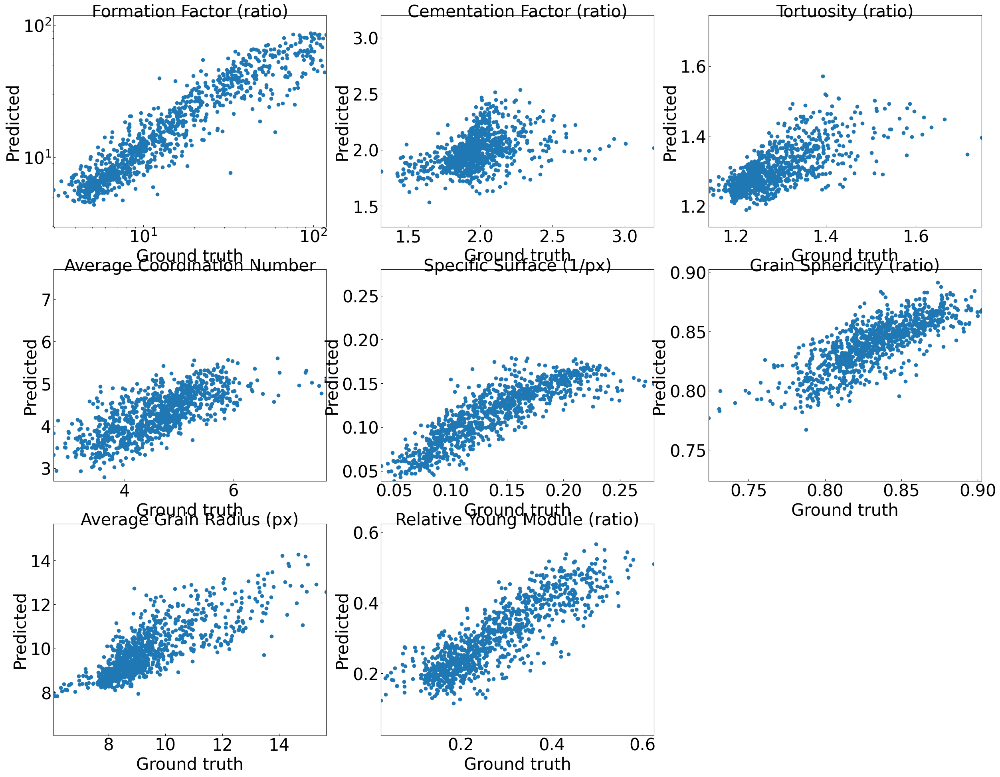

In [ ]:
# group 2
dpr.testmodel(group2,dataset_2, TestList2, ModelType=12,n=2, properties=group_2)
dpr.testmodel(group2,dataset_2, TestListShort2, ModelType=12,n=2, properties=group_2)

In [ ]:
dpr.testmodel(dp3_3,dataset_1, TestList1, ModelType=3,n=1)
dpr.testmodel(dp3_3,dataset_1, TestListShort1, ModelType=3,n=1)


Output hidden; open in https://colab.research.google.com to view.

In [ ]:
dpr.testmodel(dpr1_3,dataset_1, TestList1, ModelType=11,n=1)
dpr.testmodel(dpr1_3,dataset_1, TestListShort1, ModelType=11,n=1)


Output hidden; open in https://colab.research.google.com to view.

In [ ]:
dpr.testmodel(dpr1_6,dataset_2, TestList2, ModelType=11,n=2)
dpr.testmodel(dpr1_6,dataset_2, TestListShort2, ModelType=11,n=2)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
dpr.testmodel(dpr2_3,dataset_1, TestList1, ModelType=12,n=1)
dpr.testmodel(dpr2_3,dataset_1, TestListShort1, ModelType=12,n=1)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
dpr.testmodel(dpr2_6,dataset_2, TestList2, ModelType=12,n=2)
dpr.testmodel(dpr2_6,dataset_2, TestListShort2, ModelType=12,n=2)

Output hidden; open in https://colab.research.google.com to view.

# R - Squared average (not good)!

In [ ]:
r_dp3_3 = {}
r_dpr1_3 = {}
r_dpr1_6 = {}
r_dpr2_3 = {}
r_dpr2_6 = {}


In [ ]:
# ------------- DP3_3 --------------------

# Load the .mat file containing true and predicted values
data = sio.loadmat('Tested_Data_Model3_S1_P1515.mat')

# Extract true and predicted values
y_true = data['y']
y_pred = data['y2']

# Initialize a dictionary to store R-squared values for each property
r_dp3_3 = {}

# Iterate over each property
for i in range(y_true.shape[1]):  # Assuming y_true and y_pred have the same number of properties
    # Calculate R-squared value for the current property
    r_dp3_3[i] = r2_score(y_true[:, i], y_pred[:, i])

for i in range(15):
  print("value : "+ str(r_dp3_3[i]))

print("R-squared values for each property:", r_dp3_3)

# # Plotting
# plt.figure(figsize=(20, 10))

# # Iterate over the first 15 properties
# for i in range(15):
#     plt.subplot(3, 5, i+1)
#     plt.scatter(y_true[:, i], y_pred[:, i])
#     plt.plot([y_true[:, i].min(), y_true[:, i].max()], [y_true[:, i].min(), y_true[:, i].max()], 'k--', lw=2)
#     plt.xlabel('Actual')
#     plt.ylabel('Predicted')
#     plt.title(f'Actual vs Predicted for Property {i+1}')
#     plt.axis('equal')

# plt.tight_layout()
# plt.show()

value : 0.013874037959856644
value : 0.16131221556126873
value : 0.21173897744779624
value : 0.42562068840002765
value : 0.39519171603169756
value : 0.4670919805697348
value : -0.20437874974884251
value : 0.18852111545239836
value : 0.08209824435731083
value : -0.3349729427047816
value : 0.2704553528295657
value : 0.07596232774104072
value : 0.27462388378695646
value : 0.3017856916345033
value : 0.4950709436893276
R-squared values for each property: {0: 0.013874037959856644, 1: 0.16131221556126873, 2: 0.21173897744779624, 3: 0.42562068840002765, 4: 0.39519171603169756, 5: 0.4670919805697348, 6: -0.20437874974884251, 7: 0.18852111545239836, 8: 0.08209824435731083, 9: -0.3349729427047816, 10: 0.2704553528295657, 11: 0.07596232774104072, 12: 0.27462388378695646, 13: 0.3017856916345033, 14: 0.4950709436893276, 15: 0.0033590900055043837, 16: 0.006293396489353897, 17: 0.026323689994979138, 18: -0.29349797609098305, 19: 0.08045951278308083, 20: 0.27461559678887437, 21: -0.04662405409431902, 2

In [ ]:
# ------------- DPR1_3 --------------------

# Load the .mat file containing true and predicted values
data = sio.loadmat('Tested_Data_Model11_S1_P1515.mat')

# Extract true and predicted values
y_true = data['y']
y_pred = data['y2']

# Initialize a dictionary to store R-squared values for each property
r_dpr1_3 = {}

# Iterate over each property
for i in range(y_true.shape[1]):  # Assuming y_true and y_pred have the same number of properties
    # Calculate R-squared value for the current property
    r_dpr1_3[i] = r2_score(y_true[:, i], y_pred[:, i])

for i in range(15):
  print("value : "+ str(r_dpr1_3[i]))

print("R-squared values for each property:", r_dpr1_3)


value : 0.0076025268300224935
value : -0.044128694470265906
value : -0.06538769133369216
value : 0.0998038415574144
value : 0.30766188652684445
value : 0.15518320392325302
value : 0.013941780802550596
value : -0.02472759433703886
value : -0.34125631903139575
value : -0.2357936071028397
value : 0.3455777540563256
value : -0.06346606712401748
value : 0.10138367505541857
value : 0.4240031818844505
value : -0.12068337056807077
R-squared values for each property: {0: 0.0076025268300224935, 1: -0.044128694470265906, 2: -0.06538769133369216, 3: 0.0998038415574144, 4: 0.30766188652684445, 5: 0.15518320392325302, 6: 0.013941780802550596, 7: -0.02472759433703886, 8: -0.34125631903139575, 9: -0.2357936071028397, 10: 0.3455777540563256, 11: -0.06346606712401748, 12: 0.10138367505541857, 13: 0.4240031818844505, 14: -0.12068337056807077, 15: -0.06476518111281648, 16: -0.1467245182463519, 17: 0.05706407557595994, 18: 0.047057790958833334, 19: -0.012989057778672652, 20: 0.02323276007516306, 21: -0.080

In [ ]:
# ------------- DPR1_6 --------------------

# Load the .mat file containing true and predicted values
data = sio.loadmat('Tested_Data_Model11_S2_P1515.mat')

# Extract true and predicted values
y_true = data['y']
y_pred = data['y2']

# Initialize a dictionary to store R-squared values for each property
r_dpr1_6 = {}

# Iterate over each property
for i in range(y_true.shape[1]):  # Assuming y_true and y_pred have the same number of properties
    # Calculate R-squared value for the current property
    r_dpr1_6[i] = r2_score(y_true[:, i], y_pred[:, i])

for i in range(15):
  print("value : "+ str(r_dpr1_6[i]))

print("R-squared values for each property:", r_dpr1_6)


value : -0.12784782017809815
value : 0.19607961523568418
value : -0.10062235736853942
value : -0.262195344899566
value : 0.2901185326737846
value : 0.460306109075891
value : -0.4169774901580161
value : -0.3227403549502994
value : -1.3018500350900024
value : -0.36724261092219357
value : 0.3785321567438874
value : 0.033309424666230436
value : 0.1574441314537619
value : -0.09571283598570046
value : 0.4944433276943633
R-squared values for each property: {0: -0.12784782017809815, 1: 0.19607961523568418, 2: -0.10062235736853942, 3: -0.262195344899566, 4: 0.2901185326737846, 5: 0.460306109075891, 6: -0.4169774901580161, 7: -0.3227403549502994, 8: -1.3018500350900024, 9: -0.36724261092219357, 10: 0.3785321567438874, 11: 0.033309424666230436, 12: 0.1574441314537619, 13: -0.09571283598570046, 14: 0.4944433276943633, 15: -0.9624267365042523, 16: -0.4431590427622758, 17: -0.3363274809559309, 18: -0.6384226829619428, 19: -0.217322216643153, 20: -1.8108210206574378, 21: -0.2056058651441719, 22: -0.0

In [ ]:
# ------------- DPR2_3 --------------------

# Load the .mat file containing true and predicted values
data = sio.loadmat('Tested_Data_Model12_S1_P1515.mat')

# Extract true and predicted values
y_true = data['y']
y_pred = data['y2']

# Initialize a dictionary to store R-squared values for each property
r_dpr2_3 = {}

# Iterate over each property
for i in range(y_true.shape[1]):  # Assuming y_true and y_pred have the same number of properties
    # Calculate R-squared value for the current property
    r_dpr2_3[i] = r2_score(y_true[:, i], y_pred[:, i])

for i in range(15):
  print("value : "+ str(r_dpr2_3[i]))

print("R-squared values for each property:", r_dpr2_3)


value : 0.13415343513095268
value : 0.1510218933945653
value : -0.08405152557428397
value : 0.33704762566355806
value : 0.495037389514004
value : 0.3389947153866152
value : 0.12359341531573176
value : 0.14316167171145644
value : 0.21484046303642068
value : 0.07642030924113852
value : 0.41852424198725247
value : 0.07090279828813773
value : 0.3189700711928948
value : 0.5438931880320577
value : 0.2965732610148992
R-squared values for each property: {0: 0.13415343513095268, 1: 0.1510218933945653, 2: -0.08405152557428397, 3: 0.33704762566355806, 4: 0.495037389514004, 5: 0.3389947153866152, 6: 0.12359341531573176, 7: 0.14316167171145644, 8: 0.21484046303642068, 9: 0.07642030924113852, 10: 0.41852424198725247, 11: 0.07090279828813773, 12: 0.3189700711928948, 13: 0.5438931880320577, 14: 0.2965732610148992, 15: 0.24574039260320235, 16: 0.05556589687490032, 17: -0.013238158557189461, 18: 0.08620213892021245, 19: 0.0443269473887572, 20: 0.17126471062750692, 21: 0.17372080689310943, 22: 0.07992367

In [ ]:
# ------------- DPR2_6 --------------------

# Load the .mat file containing true and predicted values
data = sio.loadmat('Tested_Data_Model12_S2_P1515.mat')

# Extract true and predicted values
y_true = data['y']
y_pred = data['y2']

# Initialize a dictionary to store R-squared values for each property
r_dpr2_6 = {}

# Iterate over each property
for i in range(y_true.shape[1]):  # Assuming y_true and y_pred have the same number of properties
    # Calculate R-squared value for the current property
    r_dpr2_6[i] = r2_score(y_true[:, i], y_pred[:, i])

for i in range(15):
  print("value : "+ str(r_dpr2_6[i]))

print("R-squared values for each property:", r_dpr2_6)


value : 0.44887155769508036
value : 0.7247283985474695
value : 0.07149300190606522
value : 0.10166156032237539
value : 0.4658141928801547
value : 0.43996589564369437
value : 0.6870965378356833
value : 0.5321772822976061
value : 0.22401730818027554
value : 0.28400560967479527
value : 0.6162632909439565
value : 0.575691899162252
value : 0.5192483604009444
value : 0.5095372210027859
value : 0.6861425346046062
R-squared values for each property: {0: 0.44887155769508036, 1: 0.7247283985474695, 2: 0.07149300190606522, 3: 0.10166156032237539, 4: 0.4658141928801547, 5: 0.43996589564369437, 6: 0.6870965378356833, 7: 0.5321772822976061, 8: 0.22401730818027554, 9: 0.28400560967479527, 10: 0.6162632909439565, 11: 0.575691899162252, 12: 0.5192483604009444, 13: 0.5095372210027859, 14: 0.6861425346046062, 15: 0.33221817843882984, 16: -0.016371679051299992, 17: -0.19149984721553537, 18: 0.2030458524919181, 19: -0.20799502529238234, 20: -0.7436705729701718, 21: -0.5675562086562402, 22: -0.0598560057681

In [ ]:
# average r^2 for all values
pos = [val for val in list(r_dp3_3.values()) if val >= 0]
print(len(pos))
avg_dp3_3 = np.mean(pos)

pos = [val for val in list(r_dpr1_3.values()) if val >= 0]
print(len(pos))
avg_dpr1_3 = np.mean(pos)

pos = [val for val in list(r_dpr1_6.values()) if val >= 0]
print(len(pos))
avg_dpr1_6 = np.mean(pos)

pos = [val for val in list(r_dpr2_3.values()) if val >= 0]
print(len(pos))
avg_dpr2_3 = np.mean(pos)

pos = [val for val in list(r_dpr2_6.values()) if val >= 0]
print(len(pos))
avg_dpr2_6 = np.mean(pos)

# average r^2 for single values
avg_sing_dp3_3 = np.mean(list(r_dp3_3.values())[:15])
avg_sing_dpr1_3 = np.mean(list(r_dpr1_3.values())[:15])
avg_sing_dpr1_6 = np.mean(list(r_dpr1_6.values())[:15])
avg_sing_dpr2_3 = np.mean(list(r_dpr2_3.values())[:15])
avg_sing_dpr2_6 = np.mean(list(r_dpr2_6.values())[:15])

# average r^2 for range values
avg_rang_dp3_3 = np.mean(list(r_dp3_3.values())[15:])
avg_rang_dpr1_3 = np.mean(list(r_dpr1_3.values())[15:])
avg_rang_dpr1_6 = np.mean(list(r_dpr1_6.values())[15:])
avg_rang_dpr2_3 = np.mean(list(r_dpr2_3.values())[15:])
avg_rang_dpr2_6 = np.mean(list(r_dpr2_6.values())[15:])

print(avg_dp3_3)
print(avg_dpr1_3)
print(avg_dpr1_6)
print(avg_dpr2_3)
print(avg_dpr2_6)

401
291
159
280
279
0.2033689307785622
0.12140203513799663
0.25226883289365964
0.1820409522009165
0.4171452957959613


# Ref v. Estimated - single

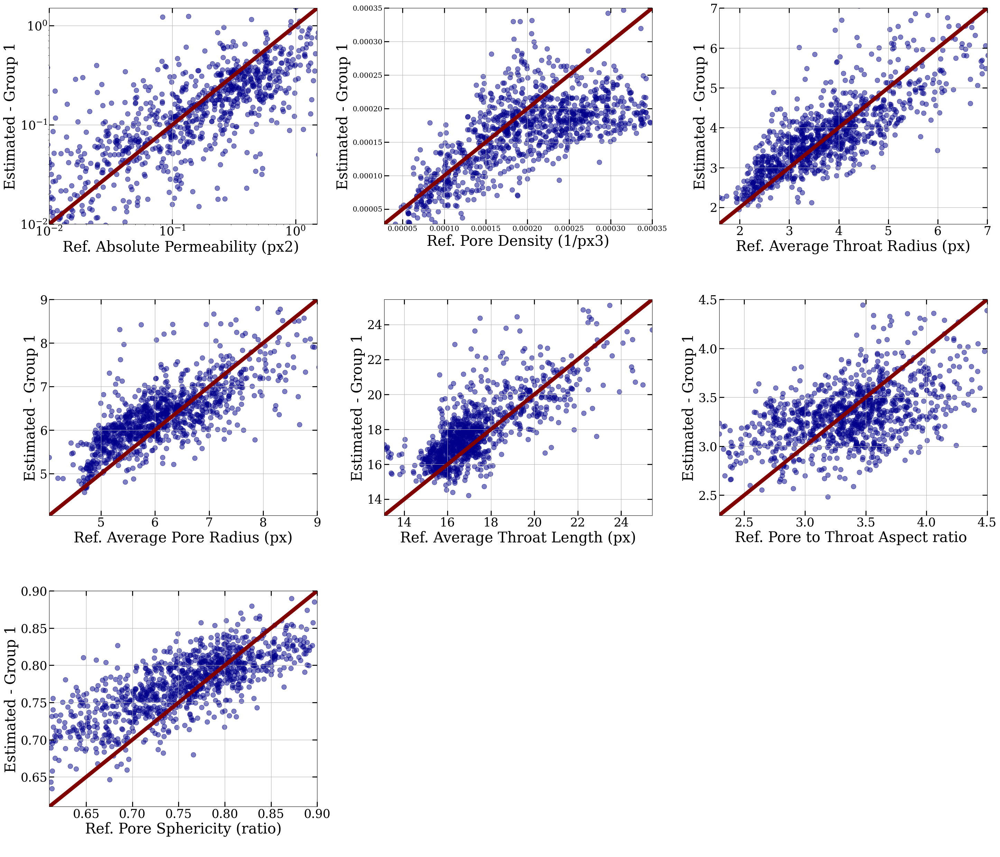

In [ ]:
# Load the .mat file containing true and predicted values
data = sio.loadmat('Tested_Data_Model12_S2_P1007.mat')

# Extract true and predicted values
y = data['y']
y2 = data['y2']

group_1 = [1,4,7,8,9,10,12]
# iterate through subtracting 1 from each
group_1 = [x-1 for x in group_1]

group_2 = [2,3,5,6,11,13,14,15]
# iterate through subtracting 1 from each
group_2 = [x-1 for x in group_2]



fig=plt.figure(figsize=(35,30))
plt.rcParams.update({'font.size': 30})
plt.rcParams.update({'font.family': 'serif'})

with open('VarNames.txt') as f:
    VarNames = list(f)
plt.subplots_adjust(hspace=0.35, wspace=0.25)
count = 0
for I in group_1:
    ax = fig.add_subplot(3,3,count+1)
    X=y[:,count]
    Y=y2[:,count]
    plt.grid(True)
    plt.scatter(X,Y, alpha=0.5, s=100, color='darkblue')
    plt.ylabel('Estimated - Group 1', fontname='serif')
    plt.xlabel('Ref. ' + VarNames[I], fontname='serif')
    plt.tick_params(direction="in", axis="both", length=10, labelsize=25, width=2, top=True, bottom=True, left=True, right=True )
    #plt.text(.5,.9,VarNames[I],horizontalalignment='center',transform=ax.transAxes) # make sure to get relevant var names if subset of properties
    min_val = min(np.min(X), np.min(Y))
    max_val = max(np.max(X), np.max(Y))
    plt.xlim(min_val,max_val)
    plt.ylim(min_val,max_val)

    count += 1

    plt.plot([min_val, max_val], [min_val, max_val], color='maroon',  linewidth=8)

    if I==0:
        ax.set_yscale('log')
        ax.set_xscale('log')
        plt.xlim(0.01, 1.5)
        plt.ylim(0.01, 1.5)
    if I == 1:
        ax.set_yscale('log')
        ax.set_xscale('log')
        plt.xlim(right=100)
        plt.ylim(top=100)
    if I == 2:
        plt.xlim(1.5, 2.5)
        plt.ylim(1.5, 2.5)
    if I == 3:
        plt.xlim(right=0.00035)
        plt.ylim(top=0.00035)
        plt.tick_params(direction="in", axis="both", length=10, labelsize=15, width=2, top=True, bottom=True, left=True, right=True )
    if I == 4:
        plt.xlim(right=1.6)
        plt.ylim(top=1.6)
    if I == 5:
        plt.xlim(right=6)
        plt.ylim(top=6)
    if I == 6:
        plt.xlim(right=7)
        plt.ylim(top=7)
    if I == 7:
        plt.xlim(right=9)
        plt.ylim(top=9)
    if I == 9:
        plt.xlim(right=4.5)
        plt.ylim(top=4.5)
    if I == 10:
        plt.xlim(right=0.25)
        plt.ylim(top=0.25)
    if I == 11:
        plt.xlim(0.61, 0.9)
        plt.ylim(0.61, 0.9)
    if I == 12:
        plt.xlim(0.78, 0.9)
        plt.ylim(0.78, 0.9)
    if I == 13:
        plt.xlim(7, 14)
        plt.ylim(7, 14)
    if I == 14:
        plt.xlim(0.1, 0.6)
        plt.ylim(0.1, 0.6)
plt.show()





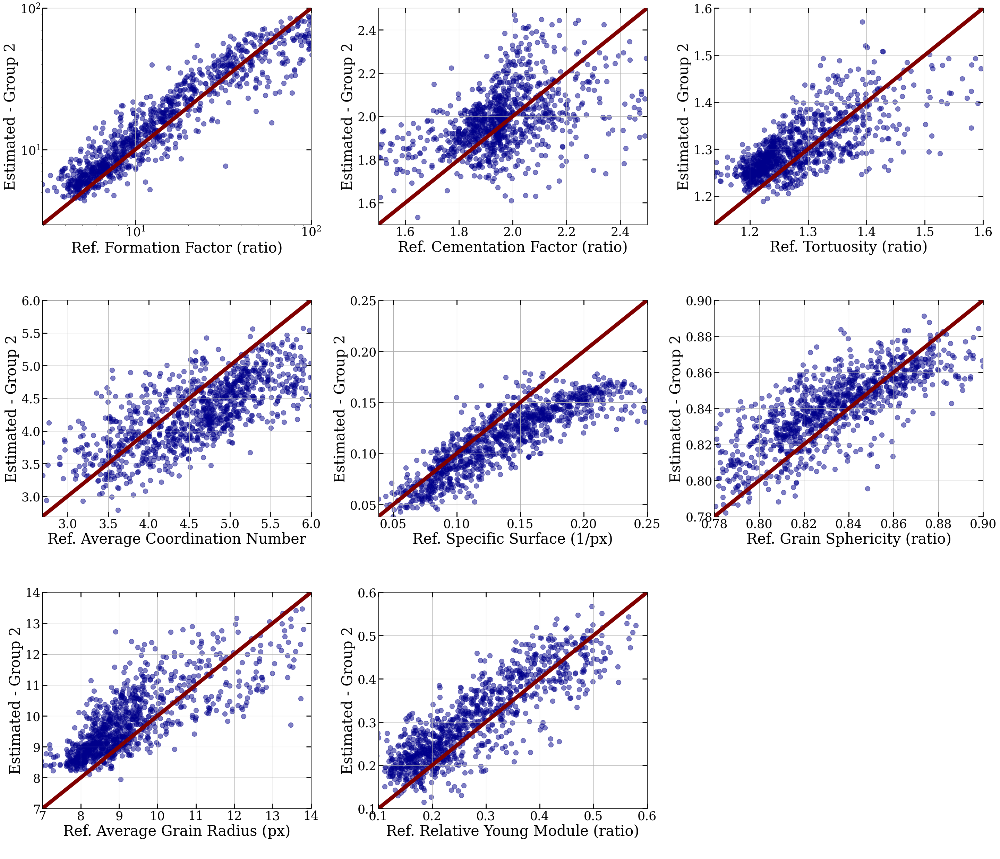

In [ ]:
# Load the .mat file containing true and predicted values
data = sio.loadmat('Tested_Data_Model12_S2_P508.mat')

# Extract true and predicted values
y = data['y']
y2 = data['y2']

group_1 = [1,4,7,8,9,10,12]
# iterate through subtracting 1 from each
group_1 = [x-1 for x in group_1]

group_2 = [2,3,5,6,11,13,14,15]
# iterate through subtracting 1 from each
group_2 = [x-1 for x in group_2]



fig=plt.figure(figsize=(35,30))
plt.rcParams.update({'font.size': 30})
plt.rcParams.update({'font.family': 'serif'})

with open('VarNames.txt') as f:
    VarNames = list(f)
plt.subplots_adjust(hspace=0.35, wspace=0.25)
count = 0
for I in group_2:
    ax = fig.add_subplot(3,3,count+1)
    X=y[:,count]
    Y=y2[:,count]
    plt.grid(True)
    plt.scatter(X,Y, alpha=0.5, s=100, color='darkblue')
    plt.ylabel('Estimated - Group 2', fontname='serif')
    plt.xlabel('Ref. ' + VarNames[I], fontname='serif')
    plt.tick_params(direction="in", axis="both", length=10, labelsize=25, width=2, top=True, bottom=True, left=True, right=True )
    #plt.text(.5,.9,VarNames[I],horizontalalignment='center',transform=ax.transAxes) # make sure to get relevant var names if subset of properties
    min_val = min(np.min(X), np.min(Y))
    max_val = max(np.max(X), np.max(Y))
    plt.xlim(min_val,max_val)
    plt.ylim(min_val,max_val)

    count += 1

    plt.plot([min_val, max_val], [min_val, max_val], color='maroon',  linewidth=8)

    if I==0:
        ax.set_yscale('log')
        ax.set_xscale('log')
        plt.xlim(0.01, 1.5)
        plt.ylim(0.01, 1.5)
    if I == 1:
        ax.set_yscale('log')
        ax.set_xscale('log')
        plt.xlim(right=100)
        plt.ylim(top=100)
    if I == 2:
        plt.xlim(1.5, 2.5)
        plt.ylim(1.5, 2.5)
    if I == 3:
        plt.xlim(right=0.00035)
        plt.ylim(top=0.00035)
        plt.tick_params(direction="in", axis="both", length=10, labelsize=15, width=2, top=True, bottom=True, left=True, right=True )
    if I == 4:
        plt.xlim(right=1.6)
        plt.ylim(top=1.6)
    if I == 5:
        plt.xlim(right=6)
        plt.ylim(top=6)
    if I == 6:
        plt.xlim(right=7)
        plt.ylim(top=7)
    if I == 7:
        plt.xlim(right=9)
        plt.ylim(top=9)
    if I == 9:
        plt.xlim(right=4.5)
        plt.ylim(top=4.5)
    if I == 10:
        plt.xlim(right=0.25)
        plt.ylim(top=0.25)
    if I == 11:
        plt.xlim(0.61, 0.9)
        plt.ylim(0.61, 0.9)
    if I == 12:
        plt.xlim(0.78, 0.9)
        plt.ylim(0.78, 0.9)
    if I == 13:
        plt.xlim(7, 14)
        plt.ylim(7, 14)
    if I == 14:
        plt.xlim(0.1, 0.6)
        plt.ylim(0.1, 0.6)
plt.show()





In [ ]:


# Load the .mat file containing true and predicted values
data = sio.loadmat('Tested_Data_Model12_S2_P1515.mat')

# Extract true and predicted values
y = data['y']
y2 = data['y2']


fig=plt.figure(figsize=(30,40))
plt.rcParams.update({'font.size': 30})
plt.rcParams.update({'font.family': 'serif'})

with open('VarNames.txt') as f:
    VarNames = list(f)
plt.subplots_adjust(hspace=0.35, wspace=0.25)
for I in range(15):
    ax = fig.add_subplot(5,3,I+1)
    X=y[:,I]
    Y=y2[:,I]
    plt.grid(True)
    plt.scatter(X,Y, alpha=0.5, s=100, color='darkblue')
    plt.ylabel('Estimated', fontname='serif')
    plt.xlabel('Ref. ' + VarNames[I], fontname='serif')
    plt.tick_params(direction="in", axis="both", length=10, labelsize=25, width=2, top=True, bottom=True, left=True, right=True )
    #plt.text(.5,.9,VarNames[I],horizontalalignment='center',transform=ax.transAxes) # make sure to get relevant var names if subset of properties
    min_val = min(np.min(X), np.min(Y))
    max_val = max(np.max(X), np.max(Y))
    plt.xlim(min_val,max_val)
    plt.ylim(min_val,max_val)

    plt.plot([min_val, max_val], [min_val, max_val], color='maroon',  linewidth=8)

    if I==0:
        ax.set_yscale('log')
        ax.set_xscale('log')
        plt.xlim(0.01, 1.5)
        plt.ylim(0.01, 1.5)
    if I == 1:
        ax.set_yscale('log')
        ax.set_xscale('log')
        plt.xlim(right=100)
        plt.ylim(top=100)
    if I == 2:
        plt.xlim(1.5, 2.5)
        plt.ylim(1.5, 2.5)
    if I == 3:
        plt.xlim(right=0.00035)
        plt.ylim(top=0.00035)
    if I == 4:
        plt.xlim(right=1.6)
        plt.ylim(top=1.6)
    if I == 5:
        plt.xlim(right=6)
        plt.ylim(top=6)
    if I == 6:
        plt.xlim(right=7)
        plt.ylim(top=7)
    if I == 7:
        plt.xlim(right=9)
        plt.ylim(top=9)
    if I == 9:
        plt.xlim(right=4.5)
        plt.ylim(top=4.5)
    if I == 10:
        plt.xlim(right=0.25)
        plt.ylim(top=0.25)
    if I == 11:
        plt.xlim(0.61, 0.9)
        plt.ylim(0.61, 0.9)
    if I == 12:
        plt.xlim(0.78, 0.9)
        plt.ylim(0.78, 0.9)
    if I == 13:
        plt.xlim(7, 14)
        plt.ylim(7, 14)
    if I == 14:
        plt.xlim(0.1, 0.6)
        plt.ylim(0.1, 0.6)
plt.show()





Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# Load the .mat file containing true and predicted values
data = sio.loadmat('Tested_Data_Model12_S1_P1515.mat')

# Extract true and predicted values
y = data['y']
y2 = data['y2']


fig=plt.figure(figsize=(30,40))
plt.rcParams.update({'font.size': 30})
plt.rcParams.update({'font.family': 'serif'})

with open('VarNames.txt') as f:
    VarNames = list(f)
plt.subplots_adjust(hspace=0.35, wspace=0.25)
for I in range(15):
    ax = fig.add_subplot(5,3,I+1)
    X=y[:,I]
    Y=y2[:,I]
    plt.grid(True)
    plt.scatter(X,Y, alpha=0.5, s=100, color='darkblue')
    plt.ylabel('Estimated', fontname='serif')
    plt.xlabel('Ref. ' + VarNames[I], fontname='serif')
    plt.tick_params(direction="in", axis="both", length=10, labelsize=25, width=2, top=True, bottom=True, left=True, right=True )
    #plt.text(.5,.9,VarNames[I],horizontalalignment='center',transform=ax.transAxes) # make sure to get relevant var names if subset of properties
    min_val = min(np.min(X), np.min(Y))
    max_val = max(np.max(X), np.max(Y))
    plt.xlim(min_val,max_val)
    plt.ylim(min_val,max_val)

    plt.plot([min_val, max_val], [min_val, max_val], color='maroon',  linewidth=8)

    if I==0:
        ax.set_yscale('log')
        ax.set_xscale('log')
        plt.xlim(0.01, 1.5)
        plt.ylim(0.01, 1.5)
    if I == 1:
        ax.set_yscale('log')
        ax.set_xscale('log')
        plt.xlim(right=100)
        plt.ylim(top=100)
    if I == 2:
        plt.xlim(1.5, 2.5)
        plt.ylim(1.5, 2.5)
    if I == 3:
        plt.xlim(right=0.00035)
        plt.ylim(top=0.00035)
    if I == 4:
        plt.xlim(right=1.6)
        plt.ylim(top=1.6)
    if I == 5:
        plt.xlim(right=6)
        plt.ylim(top=6)
    if I == 6:
        plt.xlim(right=7)
        plt.ylim(top=7)
    if I == 7:
        plt.xlim(right=9)
        plt.ylim(top=9)
    if I == 9:
        plt.xlim(right=4.5)
        plt.ylim(top=4.5)
    if I == 10:
        plt.xlim(right=0.25)
        plt.ylim(top=0.25)
    if I == 11:
        plt.xlim(0.61, 0.9)
        plt.ylim(0.61, 0.9)
    if I == 12:
        plt.xlim(0.78, 0.9)
        plt.ylim(0.78, 0.9)
    if I == 13:
        plt.xlim(7, 14)
        plt.ylim(7, 14)
    if I == 14:
        plt.xlim(0.1, 0.6)
        plt.ylim(0.1, 0.6)
plt.show()





Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# Load the .mat file containing true and predicted values
data = sio.loadmat('Tested_Data_Model11_S2_P1515.mat')

# Extract true and predicted values
y = data['y']
y2 = data['y2']


fig=plt.figure(figsize=(30,40))
plt.rcParams.update({'font.size': 30})
plt.rcParams.update({'font.family': 'serif'})

with open('VarNames.txt') as f:
    VarNames = list(f)
plt.subplots_adjust(hspace=0.35, wspace=0.25)
for I in range(15):
    ax = fig.add_subplot(5,3,I+1)
    X=y[:,I]
    Y=y2[:,I]
    plt.grid(True)
    plt.scatter(X,Y, alpha=0.5, s=100, color='darkblue')
    plt.ylabel('Estimated', fontname='serif')
    plt.xlabel('Ref. ' + VarNames[I], fontname='serif')
    plt.tick_params(direction="in", axis="both", length=10, labelsize=25, width=2, top=True, bottom=True, left=True, right=True )
    #plt.text(.5,.9,VarNames[I],horizontalalignment='center',transform=ax.transAxes) # make sure to get relevant var names if subset of properties
    min_val = min(np.min(X), np.min(Y))
    max_val = max(np.max(X), np.max(Y))
    plt.xlim(min_val,max_val)
    plt.ylim(min_val,max_val)

    plt.plot([min_val, max_val], [min_val, max_val], color='maroon',  linewidth=8)

    if I==0:
        ax.set_yscale('log')
        ax.set_xscale('log')
        plt.xlim(0.01, 1.5)
        plt.ylim(0.01, 1.5)
    if I == 1:
        ax.set_yscale('log')
        ax.set_xscale('log')
        plt.xlim(right=100)
        plt.ylim(top=100)
    if I == 2:
        plt.xlim(1.5, 2.5)
        plt.ylim(1.5, 2.5)
    if I == 3:
        plt.xlim(right=0.00035)
        plt.ylim(top=0.00035)
    if I == 4:
        plt.xlim(right=1.6)
        plt.ylim(top=1.6)
    if I == 5:
        plt.xlim(right=6)
        plt.ylim(top=6)
    if I == 6:
        plt.xlim(right=7)
        plt.ylim(top=7)
    if I == 7:
        plt.xlim(right=9)
        plt.ylim(top=9)
    if I == 9:
        plt.xlim(right=4.5)
        plt.ylim(top=4.5)
    if I == 10:
        plt.xlim(right=0.25)
        plt.ylim(top=0.25)
    if I == 11:
        plt.xlim(0.61, 0.9)
        plt.ylim(0.61, 0.9)
    if I == 12:
        plt.xlim(0.78, 0.9)
        plt.ylim(0.78, 0.9)
    if I == 13:
        plt.xlim(7, 14)
        plt.ylim(7, 14)
    if I == 14:
        plt.xlim(0.1, 0.6)
        plt.ylim(0.1, 0.6)
plt.show()





Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# Load the .mat file containing true and predicted values
data = sio.loadmat('Tested_Data_Model11_S1_P1515.mat')

# Extract true and predicted values
y = data['y']
y2 = data['y2']


fig=plt.figure(figsize=(30,40))
plt.rcParams.update({'font.size': 30})
plt.rcParams.update({'font.family': 'serif'})

with open('VarNames.txt') as f:
    VarNames = list(f)
plt.subplots_adjust(hspace=0.35, wspace=0.25)
for I in range(15):
    ax = fig.add_subplot(5,3,I+1)
    X=y[:,I]
    Y=y2[:,I]
    plt.grid(True)
    plt.scatter(X,Y, alpha=0.5, s=100, color='darkblue')
    plt.ylabel('Estimated', fontname='serif')
    plt.xlabel('Ref. ' + VarNames[I], fontname='serif')
    plt.tick_params(direction="in", axis="both", length=10, labelsize=25, width=2, top=True, bottom=True, left=True, right=True )
    #plt.text(.5,.9,VarNames[I],horizontalalignment='center',transform=ax.transAxes) # make sure to get relevant var names if subset of properties
    min_val = min(np.min(X), np.min(Y))
    max_val = max(np.max(X), np.max(Y))
    plt.xlim(min_val,max_val)
    plt.ylim(min_val,max_val)

    plt.plot([min_val, max_val], [min_val, max_val], color='maroon',  linewidth=8)

    if I==0:
        ax.set_yscale('log')
        ax.set_xscale('log')
        plt.xlim(0.01, 1.5)
        plt.ylim(0.01, 1.5)
    if I == 1:
        ax.set_yscale('log')
        ax.set_xscale('log')
        plt.xlim(right=100)
        plt.ylim(top=100)
    if I == 2:
        plt.xlim(1.5, 2.5)
        plt.ylim(1.5, 2.5)
    if I == 3:
        plt.xlim(right=0.00035)
        plt.ylim(top=0.00035)
    if I == 4:
        plt.xlim(right=1.6)
        plt.ylim(top=1.6)
    if I == 5:
        plt.xlim(right=6)
        plt.ylim(top=6)
    if I == 6:
        plt.xlim(right=7)
        plt.ylim(top=7)
    if I == 7:
        plt.xlim(right=9)
        plt.ylim(top=9)
    if I == 9:
        plt.xlim(right=4.5)
        plt.ylim(top=4.5)
    if I == 10:
        plt.xlim(right=0.25)
        plt.ylim(top=0.25)
    if I == 11:
        plt.xlim(0.61, 0.9)
        plt.ylim(0.61, 0.9)
    if I == 12:
        plt.xlim(0.78, 0.9)
        plt.ylim(0.78, 0.9)
    if I == 13:
        plt.xlim(7, 14)
        plt.ylim(7, 14)
    if I == 14:
        plt.xlim(0.1, 0.6)
        plt.ylim(0.1, 0.6)
plt.show()





Output hidden; open in https://colab.research.google.com to view.

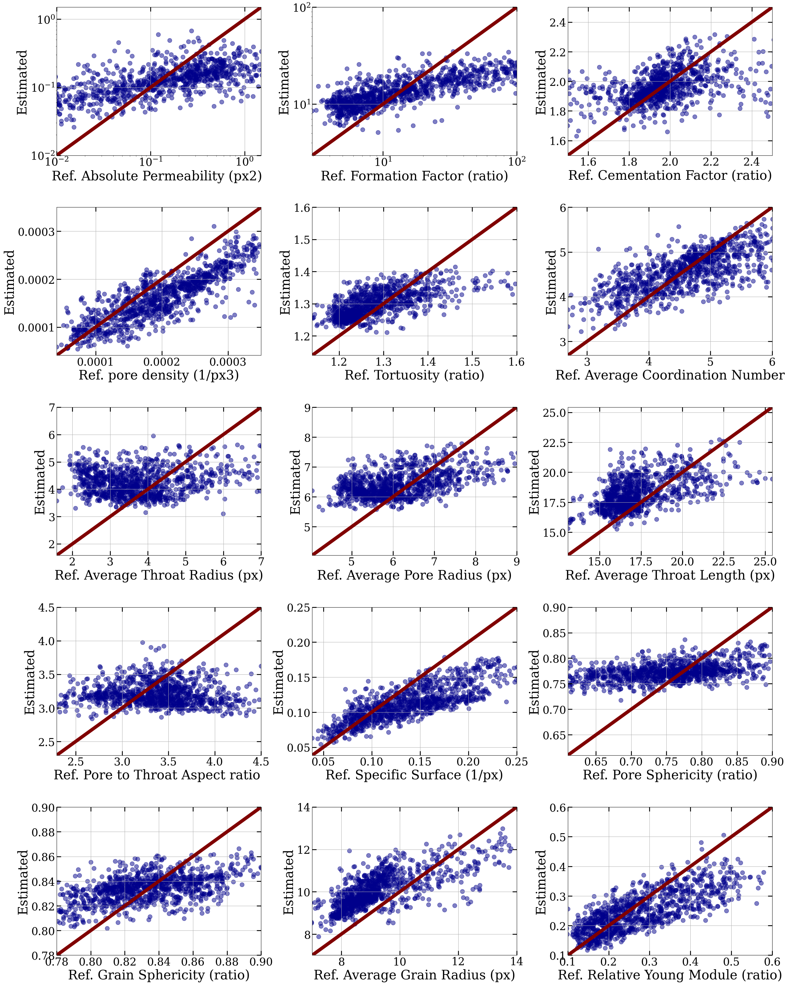

In [ ]:
# Load the .mat file containing true and predicted values
data = sio.loadmat('Tested_Data_Model3_S1_P1515.mat')

# Extract true and predicted values
y = data['y']
y2 = data['y2']


fig=plt.figure(figsize=(30,40))
plt.rcParams.update({'font.size': 30})
plt.rcParams.update({'font.family': 'serif'})

with open('VarNames.txt') as f:
    VarNames = list(f)
plt.subplots_adjust(hspace=0.35, wspace=0.25)
for I in range(15):
    ax = fig.add_subplot(5,3,I+1)
    X=y[:,I]
    Y=y2[:,I]
    plt.grid(True)
    plt.scatter(X,Y, alpha=0.5, s=100, color='darkblue')
    plt.ylabel('Estimated', fontname='serif')
    plt.xlabel('Ref. ' + VarNames[I], fontname='serif')
    plt.tick_params(direction="in", axis="both", length=10, labelsize=25, width=2, top=True, bottom=True, left=True, right=True )
    #plt.text(.5,.9,VarNames[I],horizontalalignment='center',transform=ax.transAxes) # make sure to get relevant var names if subset of properties
    min_val = min(np.min(X), np.min(Y))
    max_val = max(np.max(X), np.max(Y))
    plt.xlim(min_val,max_val)
    plt.ylim(min_val,max_val)

    plt.plot([min_val, max_val], [min_val, max_val], color='maroon',  linewidth=8)

    if I==0:
        ax.set_yscale('log')
        ax.set_xscale('log')
        plt.xlim(0.01, 1.5)
        plt.ylim(0.01, 1.5)
    if I == 1:
        ax.set_yscale('log')
        ax.set_xscale('log')
        plt.xlim(right=100)
        plt.ylim(top=100)
    if I == 2:
        plt.xlim(1.5, 2.5)
        plt.ylim(1.5, 2.5)
    if I == 3:
        plt.xlim(right=0.00035)
        plt.ylim(top=0.00035)
    if I == 4:
        plt.xlim(right=1.6)
        plt.ylim(top=1.6)
    if I == 5:
        plt.xlim(right=6)
        plt.ylim(top=6)
    if I == 6:
        plt.xlim(right=7)
        plt.ylim(top=7)
    if I == 7:
        plt.xlim(right=9)
        plt.ylim(top=9)
    if I == 9:
        plt.xlim(right=4.5)
        plt.ylim(top=4.5)
    if I == 10:
        plt.xlim(right=0.25)
        plt.ylim(top=0.25)
    if I == 11:
        plt.xlim(0.61, 0.9)
        plt.ylim(0.61, 0.9)
    if I == 12:
        plt.xlim(0.78, 0.9)
        plt.ylim(0.78, 0.9)
    if I == 13:
        plt.xlim(7, 14)
        plt.ylim(7, 14)
    if I == 14:
        plt.xlim(0.1, 0.6)
        plt.ylim(0.1, 0.6)
plt.show()





# Ref v estimated - range

In [ ]:
import random

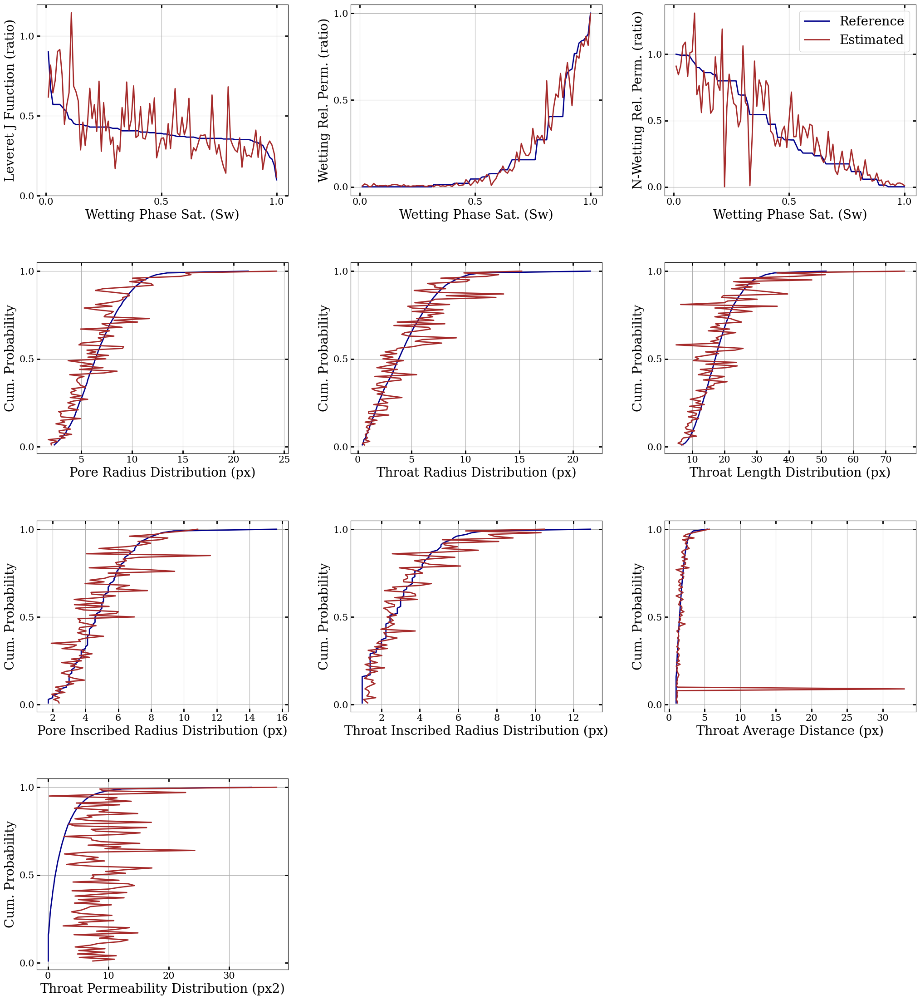

In [ ]:
# Load the .mat file containing true and predicted values
data = sio.loadmat('Tested_Data_Model12_S2_P1007.mat')

# Extract true and predicted values
y = data['y']
y2 = data['y2']

group_1 = [16,17,18,20,21,22,23,24,25,26]
# iterate through subtracting 1 from each
group_1 = [x-1 for x in group_1]

group_2 = [19,27,28,29,30]
# iterate through subtracting 1 from each
group_2 = [x-1 for x in group_2]

fig=plt.figure(figsize=(25,35))
plt.rcParams.update({'font.size': 20})
plt.rcParams.update({'font.family': 'serif'})

with open('VarNames.txt') as f:
  VarNames = list(f)

VarNames[16] = 'Wetting Rel. Perm. (ratio)'
VarNames[17] = 'N-Wetting Rel. Perm. (ratio)'
VarNames[18] = 'Correlation Function'

plt.subplots_adjust(hspace=0.35, wspace=0.25)
# random_num = random.randint(1,1000)
# print(random_num) # 127 chosen from random num generator for consistency among model testing

normalRange = list(range(1,101))
normalRange = [x/100 for x in normalRange]

fiftyRange = [x*50 for x in normalRange]

count = 0
for I in group_1:
  ax = fig.add_subplot(5,3,count+1)
  ref = y[127, (count*100)+7:(count*100)+107]
  est = y2[127, (count*100)+7:(count*100)+107]
  plt.tick_params(direction="in", axis="both", length=5, labelsize=15, width=2, top=True, bottom=True, left=True, right=True )
  plt.grid(True)
  t=VarNames[I].strip()

  if I in [15,16,17]:
      plt.ylabel(t)
      plt.xlabel('Wetting Phase Sat. (Sw)')
      plt.plot(normalRange, ref, label="Reference",color='darkblue', linewidth=2)
      plt.plot(normalRange, est, label="Estimated", color='brown',linewidth=2)
      plt.xticks([0,0.5,1])
      plt.yticks([0,0.5,1])

  elif I in [18]:
      plt.ylabel(str(t))
      plt.xlabel('Lag (px)')
      plt.plot(fiftyRange, ref, label="Reference", color='darkblue', linewidth=2)
      plt.plot(fiftyRange, est, label="Estimated", color='brown', linewidth=2)
      plt.xticks([0,20,40])
      plt.yticks([0.1,0.2,0.3, 0.4])

  else:
      plt.xlabel(str(t))
      plt.ylabel('Cum. Probability')
      plt.plot(ref, normalRange, label="Reference",color='darkblue',linewidth=2)
      plt.plot(est, normalRange, label="Estimated", color='brown', linewidth=2)
      plt.yticks([0,0.5,1])

  if I == 17:
    plt.legend()

  count += 1

plt.show()


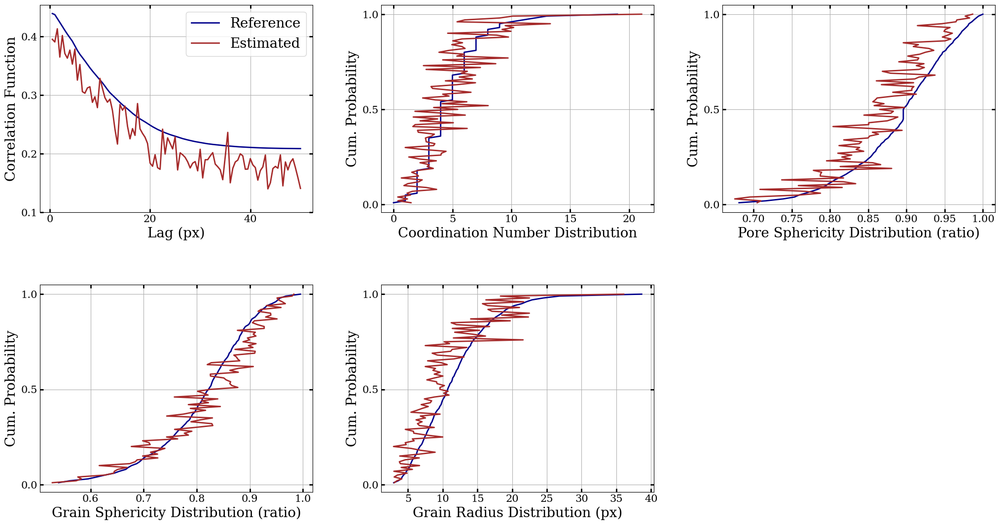

In [ ]:
# Load the .mat file containing true and predicted values
data = sio.loadmat('Tested_Data_Model12_S2_P508.mat')

# Extract true and predicted values
y = data['y']
y2 = data['y2']

group_1 = [16,17,18,20,21,22,23,24,25,26]
# iterate through subtracting 1 from each
group_1 = [x-1 for x in group_1]

group_2 = [19,27,28,29,30]
# iterate through subtracting 1 from each
group_2 = [x-1 for x in group_2]

fig=plt.figure(figsize=(25,35))
plt.rcParams.update({'font.size': 20})
plt.rcParams.update({'font.family': 'serif'})

with open('VarNames.txt') as f:
  VarNames = list(f)

VarNames[16] = 'Wetting Rel. Perm. (ratio)'
VarNames[17] = 'N-Wetting Rel. Perm. (ratio)'
VarNames[18] = 'Correlation Function'

plt.subplots_adjust(hspace=0.35, wspace=0.25)
# random_num = random.randint(1,1000)
# print(random_num) # 127 chosen from random num generator for consistency among model testing

normalRange = list(range(1,101))
normalRange = [x/100 for x in normalRange]

fiftyRange = [x*50 for x in normalRange]

count = 0
for I in group_2:
  ax = fig.add_subplot(5,3,count+1)
  ref = y[127, (count*100)+8:(count*100)+108]
  est = y2[127, (count*100)+8:(count*100)+108]
  plt.tick_params(direction="in", axis="both", length=5, labelsize=15, width=2, top=True, bottom=True, left=True, right=True )
  plt.grid(True)
  t=VarNames[I].strip()

  if I in [15,16,17]:
      plt.ylabel(t)
      plt.xlabel('Wetting Phase Sat. (Sw)')
      plt.plot(normalRange, ref, label="Reference",color='darkblue', linewidth=2)
      plt.plot(normalRange, est, label="Estimated", color='brown',linewidth=2)
      plt.xticks([0,0.5,1])
      plt.yticks([0,0.5,1])

  elif I in [18]:
      plt.ylabel(str(t))
      plt.xlabel('Lag (px)')
      plt.plot(fiftyRange, ref, label="Reference", color='darkblue', linewidth=2)
      plt.plot(fiftyRange, est, label="Estimated", color='brown', linewidth=2)
      plt.xticks([0,20,40])
      plt.yticks([0.1,0.2,0.3, 0.4])

  else:
      plt.xlabel(str(t))
      plt.ylabel('Cum. Probability')
      plt.plot(ref, normalRange, label="Reference",color='darkblue',linewidth=2)
      plt.plot(est, normalRange, label="Estimated", color='brown', linewidth=2)
      plt.yticks([0,0.5,1])

  if count == 0:
    plt.legend()

  count += 1

plt.show()


In [ ]:
# group 1

# Load the .mat file containing true and predicted values
data = sio.loadmat('Tested_Data_Model3_S1_P1515.mat')

# Extract true and predicted values
y = data['y']
y2 = data['y2']

fig=plt.figure(figsize=(25,35))
plt.rcParams.update({'font.size': 20})
plt.rcParams.update({'font.family': 'serif'})

with open('VarNames.txt') as f:
  VarNames = list(f)

VarNames[16] = 'Wetting Rel. Perm. (ratio)'
VarNames[17] = 'N-Wetting Rel. Perm. (ratio)'
VarNames[18] = 'Correlation Function'

plt.subplots_adjust(hspace=0.35, wspace=0.25)
# random_num = random.randint(1,1000)
# print(random_num) # 127 chosen from random num generator for consistency among model testing

normalRange = list(range(1,101))
normalRange = [x/100 for x in normalRange]

fiftyRange = [x*50 for x in normalRange]

for I in range(15):
  ax = fig.add_subplot(5,3,I+1)
  ref = y[127, (I*100)+15:(I*100)+115]
  est = y2[127, (I*100)+15:(I*100)+115]
  plt.tick_params(direction="in", axis="both", length=5, labelsize=15, width=2, top=True, bottom=True, left=True, right=True )
  plt.grid(True)
  t=VarNames[I+15].strip()

  if I+15 in [15,16,17]:
      plt.ylabel(t)
      plt.xlabel('Wetting Phase Sat. (Sw)')
      plt.plot(normalRange, ref, label="Reference",color='darkblue', linewidth=2)
      plt.plot(normalRange, est, label="Estimated", color='brown',linewidth=2)
      plt.xticks([0,0.5,1])
      plt.yticks([0,0.5,1])

  elif I+15 in [18]:
      plt.ylabel(str(t))
      plt.xlabel('Lag (px)')
      plt.plot(fiftyRange, ref, label="Reference", color='darkblue', linewidth=2)
      plt.plot(fiftyRange, est, label="Estimated", color='brown', linewidth=2)
      plt.xticks([0,20,40])
      plt.yticks([0.1,0.2,0.3, 0.4])

  else:
      plt.xlabel(str(t))
      plt.ylabel('Cum. Probability')
      plt.plot(ref, normalRange, label="Reference",color='darkblue',linewidth=2)
      plt.plot(est, normalRange, label="Estimated", color='brown', linewidth=2)
      plt.yticks([0,0.5,1])

  if I+15 == 17:
    plt.legend()


plt.show()


In [ ]:
127

# Ref/Est Dist for single vals

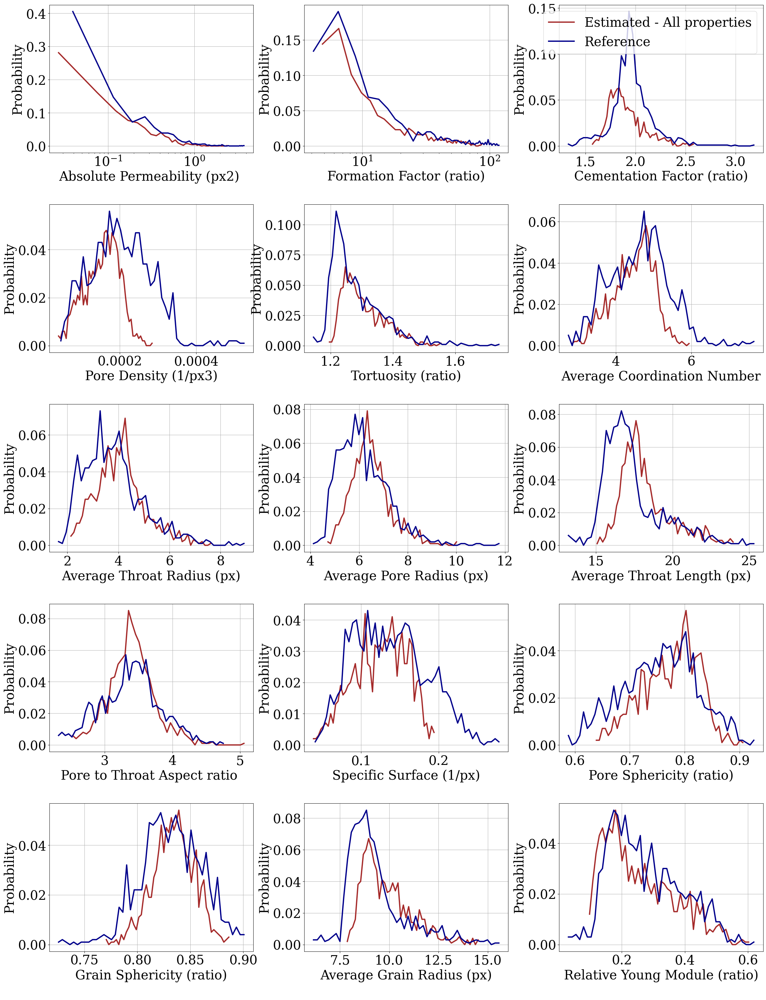

In [ ]:
# Load the .mat file containing true and predicted values
data = sio.loadmat('Tested_Data_Model12_S2_P1515.mat')

plt.rcParams.update({'font.family': 'serif'})

# Extract true and predicted values
y = data['y']
y2 = data['y2']

fig=plt.figure(figsize=(30,40))

with open('VarNames.txt') as f:
    VarNames = list(f)
plt.subplots_adjust(hspace=0.35, wspace=0.25)

for I in range(15):
    ax = fig.add_subplot(5,3,I+1)

    # Create a histogram
    hist, bins = np.histogram(y2[:,I], bins=50, density=True)
    # Calculate the probability for each bin
    bin_centers = (bins[:-1] + bins[1:]) / 2
    probabilities = hist * np.diff(bins)
    # Plot the estimated values against their corresponding probabilities using a line chart
    plt.plot(bin_centers, probabilities, linestyle='-', label='Estimated - All properties',color='brown',linewidth=3)

    # Create a histogram
    hist, bins = np.histogram(y[:,I], bins=50, density=True)
    # Calculate their probability for each bin
    bin_centers = (bins[:-1] + bins[1:]) / 2
    probabilities = hist * np.diff(bins)
    # Plot the estimated values against their corresponding probabilities using a line chart
    plt.plot(bin_centers, probabilities, linestyle='-', color='darkblue', label='Reference',linewidth=3)

    plt.xlabel(VarNames[I])
    plt.ylabel('Probability')
    plt.grid(True)

    if I==0 or I==1:
       ax.set_xscale('log')

    if I+15 == 17:
      plt.legend()


plt.show()



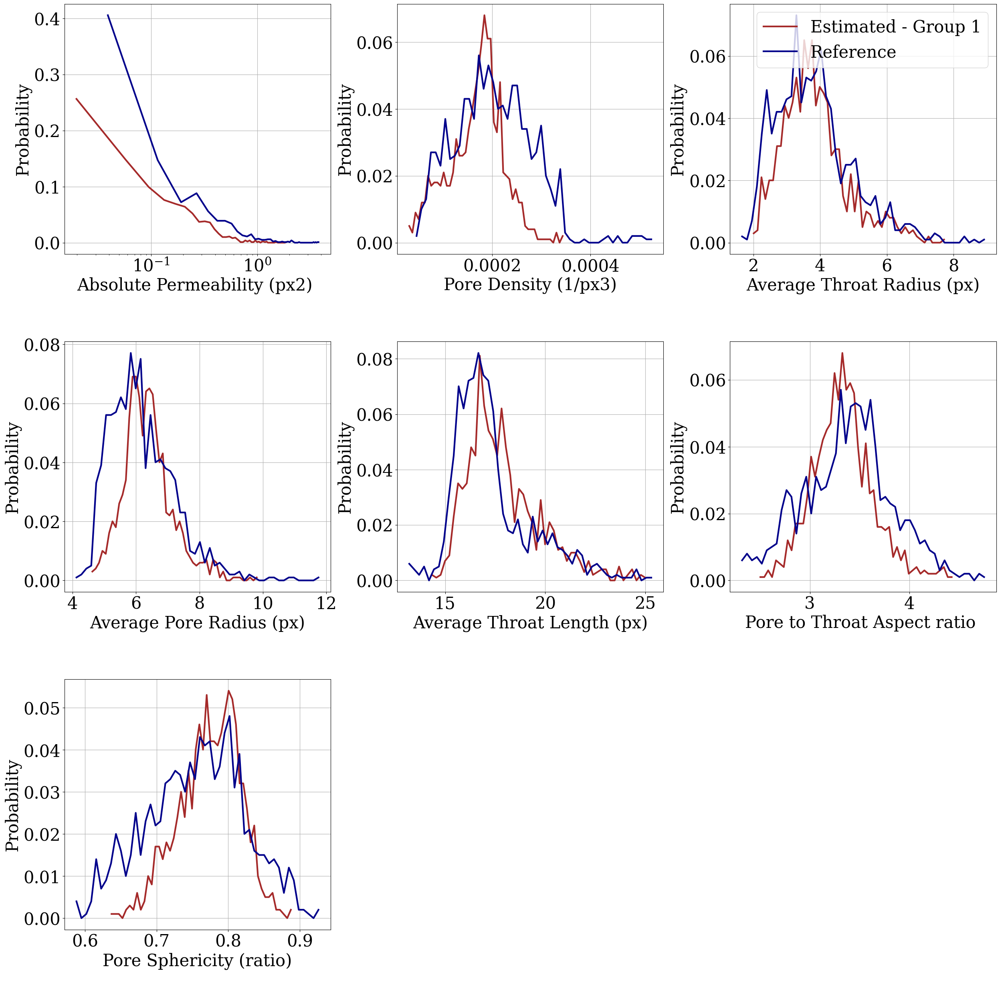

In [ ]:
# Load the .mat file containing true and predicted values
data = sio.loadmat('Tested_Data_Model12_S2_P1007.mat')

group_1 = [1,4,7,8,9,10,12]
# iterate through subtracting 1 from each
group_1 = [x-1 for x in group_1]

group_2 = [2,3,5,6,11,13,14,15,19,27,28,29,30]
# iterate through subtracting 1 from each
group_2 = [x-1 for x in group_2]


plt.rcParams.update({'font.family': 'serif'})

# Extract true and predicted values
y = data['y']
y2 = data['y2']

fig=plt.figure(figsize=(30,30))

with open('VarNames.txt') as f:
    VarNames = list(f)
plt.subplots_adjust(hspace=0.35, wspace=0.25)

count = 0
for I in group_1:
    ax = fig.add_subplot(3,3,count+1)

    # Create a histogram
    hist, bins = np.histogram(y2[:,count], bins=50, density=True)
    # Calculate the probability for each bin
    bin_centers = (bins[:-1] + bins[1:]) / 2
    probabilities = hist * np.diff(bins)
    # Plot the estimated values against their corresponding probabilities using a line chart
    plt.plot(bin_centers, probabilities, linestyle='-', label='Estimated - Group 1',color='brown',linewidth=3)

    # Create a histogram
    hist, bins = np.histogram(y[:,count], bins=50, density=True)
    # Calculate their probability for each bin
    bin_centers = (bins[:-1] + bins[1:]) / 2
    probabilities = hist * np.diff(bins)
    # Plot the estimated values against their corresponding probabilities using a line chart
    plt.plot(bin_centers, probabilities, linestyle='-', color='darkblue', label='Reference',linewidth=3)

    plt.xlabel(VarNames[I])
    plt.ylabel('Probability')
    plt.grid(True)

    count += 1

    if I==0 or I==1:
       ax.set_xscale('log')

    if I == 6:
      plt.legend()


plt.show()



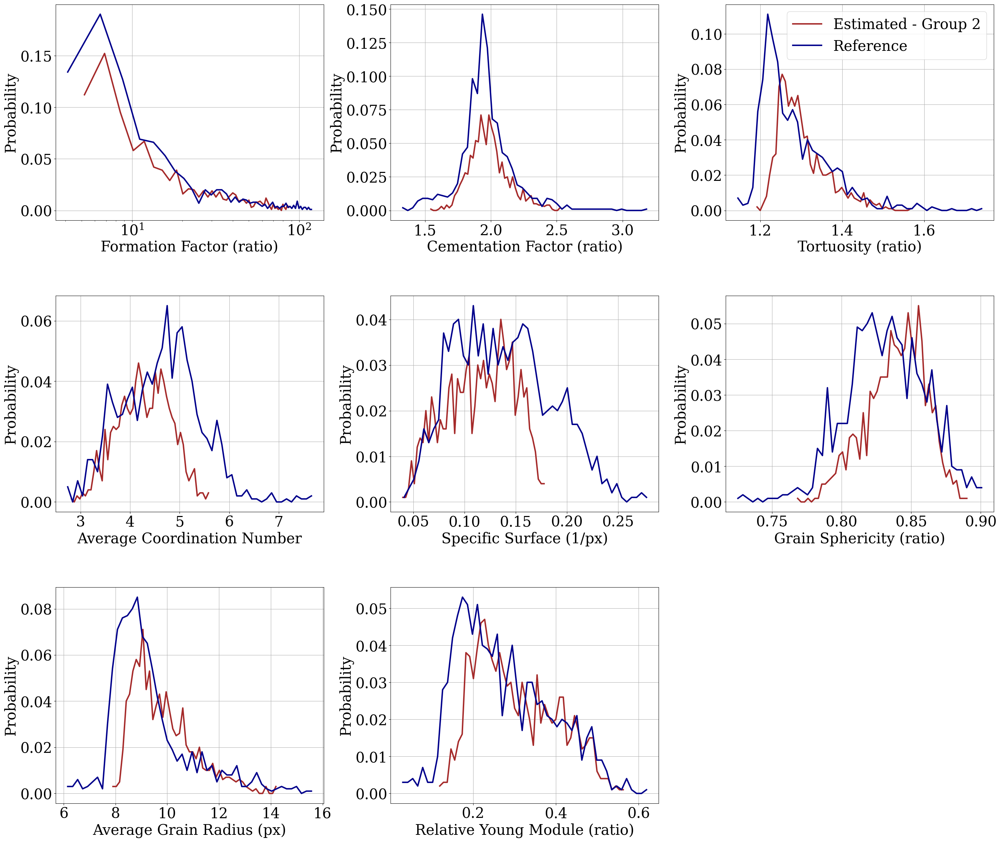

In [ ]:
# Load the .mat file containing true and predicted values
data = sio.loadmat('Tested_Data_Model12_S2_P508.mat')

group_1 = [1,4,7,8,9,10,12]
# iterate through subtracting 1 from each
group_1 = [x-1 for x in group_1]

group_2 = [2,3,5,6,11,13,14,15]
# iterate through subtracting 1 from each
group_2 = [x-1 for x in group_2]


plt.rcParams.update({'font.family': 'serif'})

# Extract true and predicted values
y = data['y']
y2 = data['y2']

fig=plt.figure(figsize=(35,30))

with open('VarNames.txt') as f:
    VarNames = list(f)
plt.subplots_adjust(hspace=0.35, wspace=0.25)

count = 0
for I in group_2:
    ax = fig.add_subplot(3,3,count+1)

    # Create a histogram
    hist, bins = np.histogram(y2[:,count], bins=50, density=True)
    # Calculate the probability for each bin
    bin_centers = (bins[:-1] + bins[1:]) / 2
    probabilities = hist * np.diff(bins)
    # Plot the estimated values against their corresponding probabilities using a line chart
    plt.plot(bin_centers, probabilities, linestyle='-', label='Estimated - Group 2',color='brown',linewidth=3)

    # Create a histogram
    hist, bins = np.histogram(y[:,count], bins=50, density=True)
    # Calculate their probability for each bin
    bin_centers = (bins[:-1] + bins[1:]) / 2
    probabilities = hist * np.diff(bins)
    # Plot the estimated values against their corresponding probabilities using a line chart
    plt.plot(bin_centers, probabilities, linestyle='-', color='darkblue', label='Reference',linewidth=3)

    plt.xlabel(VarNames[I])
    plt.ylabel('Probability')
    plt.grid(True)

    count += 1

    if I==0 or I==1:
       ax.set_xscale('log')

    if I == 4:
      plt.legend()


plt.show()

